In [ ]:
pip install requests networkx matplotlib SPARQLWrapper

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 564.9/564.9 kB 13.2 MB/s eta 0:00:00


In [ ]:
import requests
import networkx as nx
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", message=".*Glyph*")

## 1. wiki query tempalate

In [ ]:
import requests
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx
import matplotlib.pyplot as plt
import time

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

def get_qid(label):
    """Get the corresponding entity QID through the tag (make sure you get the ID starting with Q)"""
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        # Extract QID
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        return qid
    return None

def query_entity_properties(qid, depth=3):
    """Recursively query the attributes and related entities of an entity"""
    if depth == 0:
        return

    # Add delays to avoid triggering API throttling
    time.sleep(1)

    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # Add nodes and edges to the knowledge graph
        knowledge_graph.add_node(qid, label=qid)
        knowledge_graph.add_node(value, label=value)
        knowledge_graph.add_edge(qid, value, label=prop)

        # If the value is an entity (QID), recursively query
        if "wikidata.org/entity/" in value_uri:
            next_qid = value_uri.split("/")[-1]
            query_entity_properties(next_qid, depth-1)

def build_knowledge_graph(labels, max_depth=3):
    """Build a knowledge graph"""
    for label in labels:
        qid = get_qid(label)
        if qid:
            query_entity_properties(qid, depth=max_depth)

    nx.write_gml(knowledge_graph, "knowledge_graph_image.gml")
    print("知识图谱已保存为 knowledge_graph_image.gml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(knowledge_graph)
    nx.draw(knowledge_graph, pos, with_labels=True, node_size=2, font_size=0.1)
    edge_labels = nx.get_edge_attributes(knowledge_graph, "label")
    nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels)
    plt.savefig("knowledge_graph_image.png")
    plt.show()

labels = ["image"]
build_knowledge_graph(labels, max_depth=3)

In [ ]:
get_qid("image")

'Q478798'

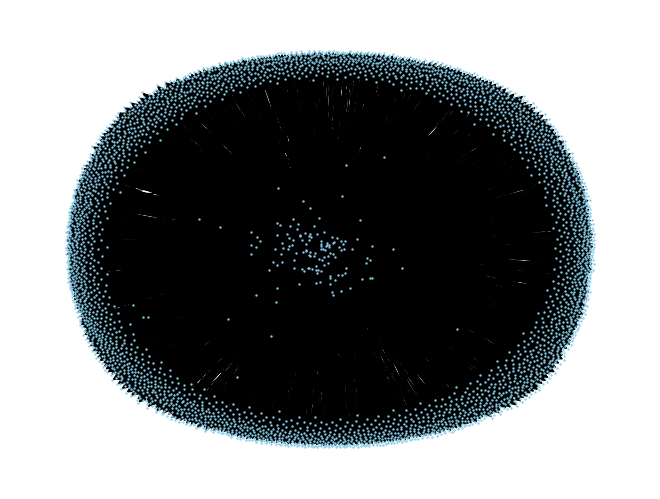

In [ ]:
G = nx.read_graphml("knowledge_graph.graphml")

nx.draw(G, with_labels=False, node_size=0.5, node_color="skyblue", font_size=0.1)
plt.show()

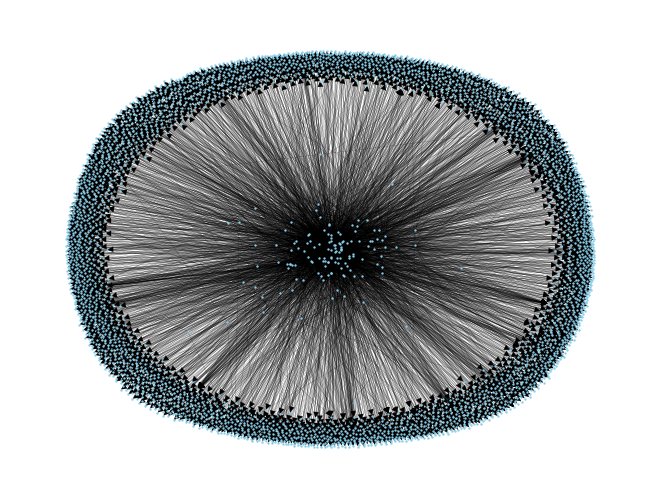

In [ ]:
nx.draw(G, with_labels=False, node_size=0.5, node_color="skyblue", width=0.1, font_size=0.1)
plt.show()

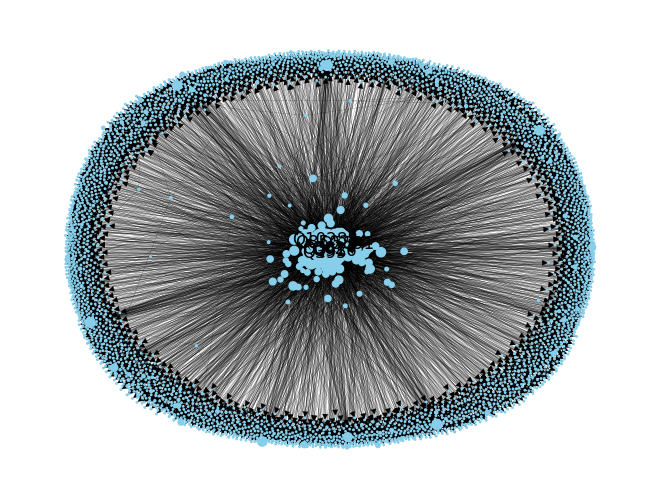

In [ ]:
labels = {node: node for node in G.nodes() if nx.degree(G, node) > 100}
node_sizes = [1.1 * nx.degree(G, node) for node in G.nodes()]
pos = nx.spring_layout(G)

nx.draw(G, with_labels=False, node_size=node_sizes, node_color="skyblue", width=0.1, font_size=0.1)
nx.draw_networkx_labels(G, pos, labels=labels)
plt.show()

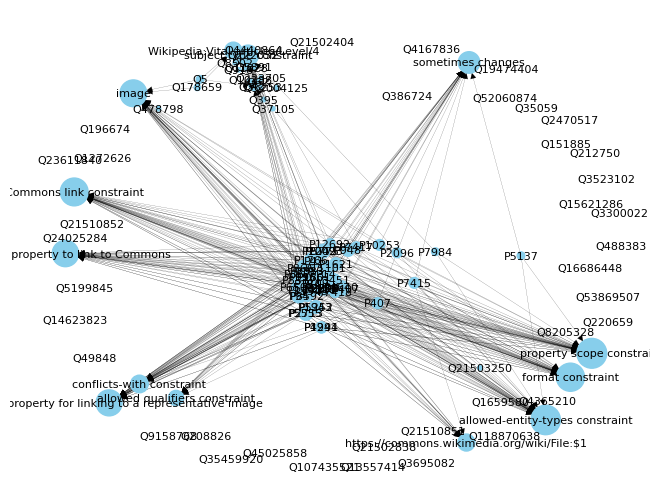

In [ ]:
# Only show nodes with degree greater than 10
filtered_nodes = [node for node in G.nodes() if nx.degree(G, node) > 10]
subgraph = G.subgraph(filtered_nodes)
labels = {node: node for node in subgraph.nodes()}
node_sizes = [10 * nx.degree(subgraph, node) for node in subgraph.nodes()]

pos = nx.spring_layout(subgraph)

nx.draw(subgraph, pos, with_labels=False, node_size=node_sizes, node_color="skyblue", width=0.1, font_size=0.1)
nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=8)
plt.show()

In [ ]:
filtered_nodes

['Q478798',
 'image',
 'P18',
 'P41',
 'Wikidata property to link to Commons',
 'format constraint',
 'Commons link constraint',
 'subject type constraint',
 'allowed qualifiers constraint',
 'Wikidata property for linking to a representative image',
 'allowed-entity-types constraint',
 'sometimes changes',
 'property scope constraint',
 'P14',
 'P94',
 'conflicts-with constraint',
 'https://commons.wikimedia.org/wiki/File:$1',
 'P109',
 'P154',
 'P242',
 'P158',
 'P407',
 'P367',
 'Q62',
 'Wikipedia:Vital articles/Level/4',
 'P996',
 'P948',
 'P1801',
 'P1943',
 'P1944',
 'P2096',
 'Q42',
 'P3311',
 'P1442',
 'P2713',
 'P4640',
 'P5137',
 'P5252',
 'P3383',
 'P3451',
 'P4291',
 'P1543',
 'P1621',
 'P2716',
 'P2910',
 'P5555',
 'P5775',
 'P6500',
 'P6802',
 'Q10288',
 'P11101',
 'P1766',
 'P7407',
 'P7415',
 'P7417',
 'P8592',
 'P8667',
 'P10093',
 'P10253',
 'Q5199845',
 'Q21510852',
 'Q23611840',
 'Q178659',
 'Q223705',
 'Q21502404',
 'P7418',
 'P8517',
 'Q24025284',
 'Q21502838',
 '

## 2. Wiki Query -> KG
-> 需要把P作为边的属性存储保留，而不是节点

知识图谱已保存为 knowledge_graph.graphml


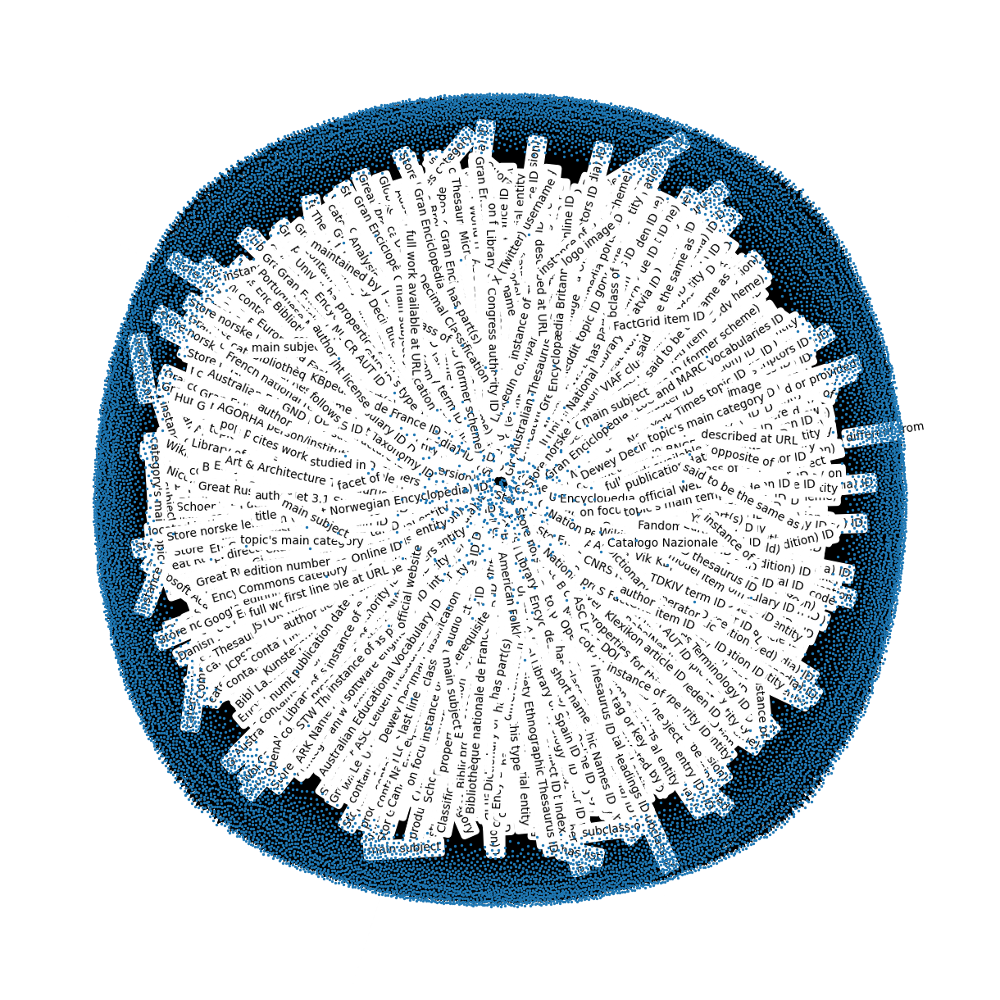

In [ ]:
import requests
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx
import matplotlib.pyplot as plt
import time

SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

knowledge_graph = nx.DiGraph()
visited_entities = {}  # record the entities that have been queried and their sources (labels and attributes) to avoid repeated processing

def get_qid(label):
    """Get the corresponding entity QID through the tag (make sure you get the ID starting with Q)"""
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        # Extract QID
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        return qid
    return None

def query_entity_properties(qid, label, depth=3):
    """Recursively query the attributes and related entities of the entity and return triples."""
    if depth == 0 or qid in visited_entities:
        return

    time.sleep(1)

    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    # Mark the entity as having been queried and record the source
    if qid not in visited_entities:
        visited_entities[qid] = set()

    visited_entities[qid].add(label)  # Label recording the source of this entity

    # Iterate through all properties
    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # save triplet (Entity, Property, Entity)
        knowledge_graph.add_node(qid, label=qid)
        knowledge_graph.add_node(value, label=value)
        knowledge_graph.add_edge(qid, value, label=prop)

        # If the value is an entity (QID), recursively query
        if "wikidata.org/entity/" in value_uri:
            next_qid = value_uri.split("/")[-1]
            query_entity_properties(next_qid, label, depth-1)

def build_knowledge_graph(labels, max_depth=3):
    """Build a knowledge graph"""
    for label in labels:
        qid = get_qid(label)
        if qid:
            query_entity_properties(qid, label, depth=max_depth)

    # Save plot to file
    nx.write_graphml(knowledge_graph, "knowledge_graph.graphml")
    print("知识图谱已保存为 knowledge_graph.graphml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(knowledge_graph)
    nx.draw(knowledge_graph, pos, with_labels=False, node_size=2, font_size=0.1)
    edge_labels = nx.get_edge_attributes(knowledge_graph, "label")
    nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels)
    plt.savefig("knowledge_graph.png")
    plt.show()

labels = ["image", "artificial intelligence", "machine learning"]
build_knowledge_graph(labels, max_depth=3)

In [ ]:
# Create a sample diagram
Gtest = nx.erdos_renyi_graph(50, 0.3)
nx.write_gml(Gtest, "Gtest.gml")
print("The knowledge graph has been saved as Gtest.gml")

In [ ]:
nx.write_gml(knowledge_graph, "knowledge_graph_KG.gml")

In [ ]:
knowledge_graph

## Subset of One word

与 'image' 相关的子图已保存为 image_subgraph.gml


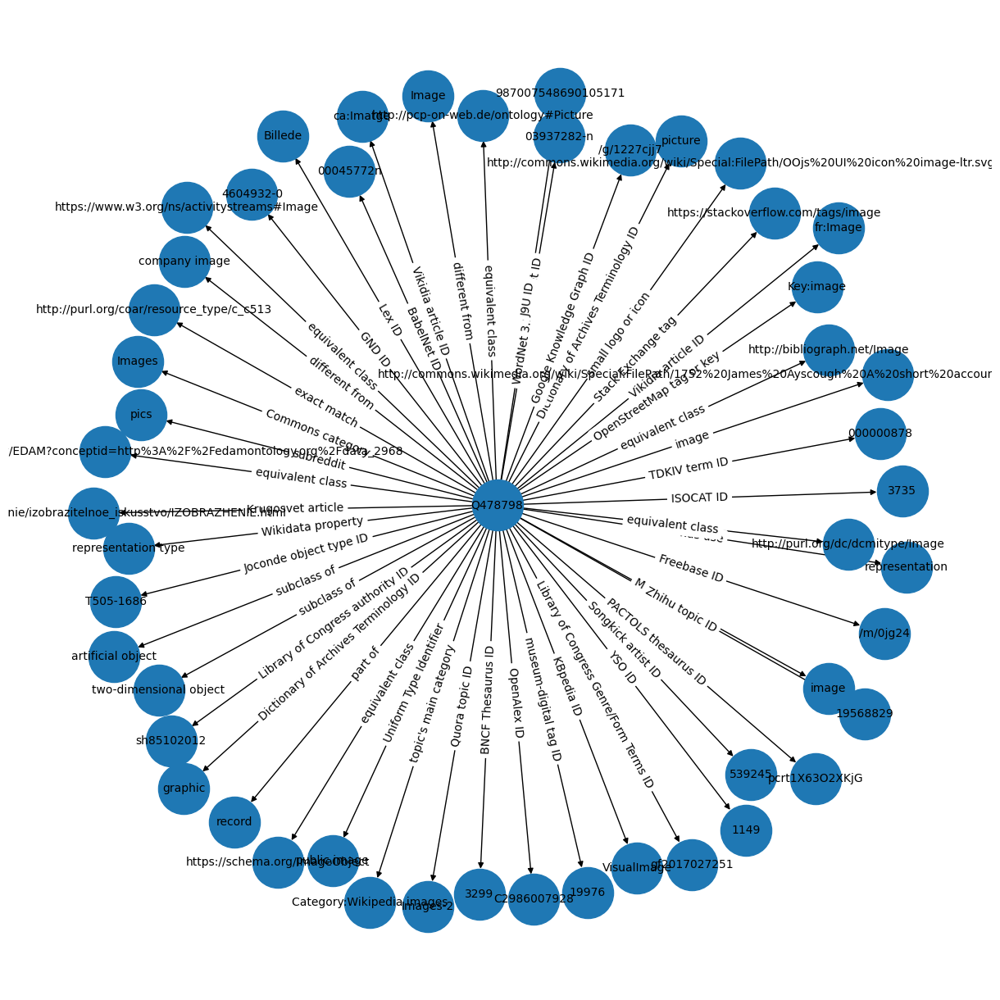

In [ ]:
import networkx as nx

def extract_subgraph(graph, start_node):
    """
    Extract the subgraph related to the specified node from the knowledge graph and traverse until there are no more associated nodes.

    :param graph: original knowledge graph (NetworkX graph object)
    :param start_node: starting node (such as the QID corresponding to "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize subgraph
    subgraph = nx.DiGraph()

    # Traversal using BFS
    visited = set()  # Record visited nodes
    queue = [start_node]  # current node

    while queue:
        current_node = queue.pop(0)

        # If the node has been visited, skip
        if current_node in visited:
            continue

        # Mark node as visited
        visited.add(current_node)

        # Add the current node and its properties to the subgraph
        subgraph.add_node(current_node, **graph.nodes[current_node])

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # Add edges to subgraph
            subgraph.add_edge(current_node, neighbor, **graph.edges[current_node, neighbor])

            # Add neighbor nodes to queue
            queue.append(neighbor)

    return subgraph

# Example: Extract subimages related to "image"
image_qid = get_qid("image")  # Get the QID of "image"
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, image_qid)

    # save
    nx.write_gml(subgraph, "image_subgraph.gml")
    print("The subgraph related to 'image' has been saved as image_subgraph.gml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    plt.savefig("image_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'image' not found")

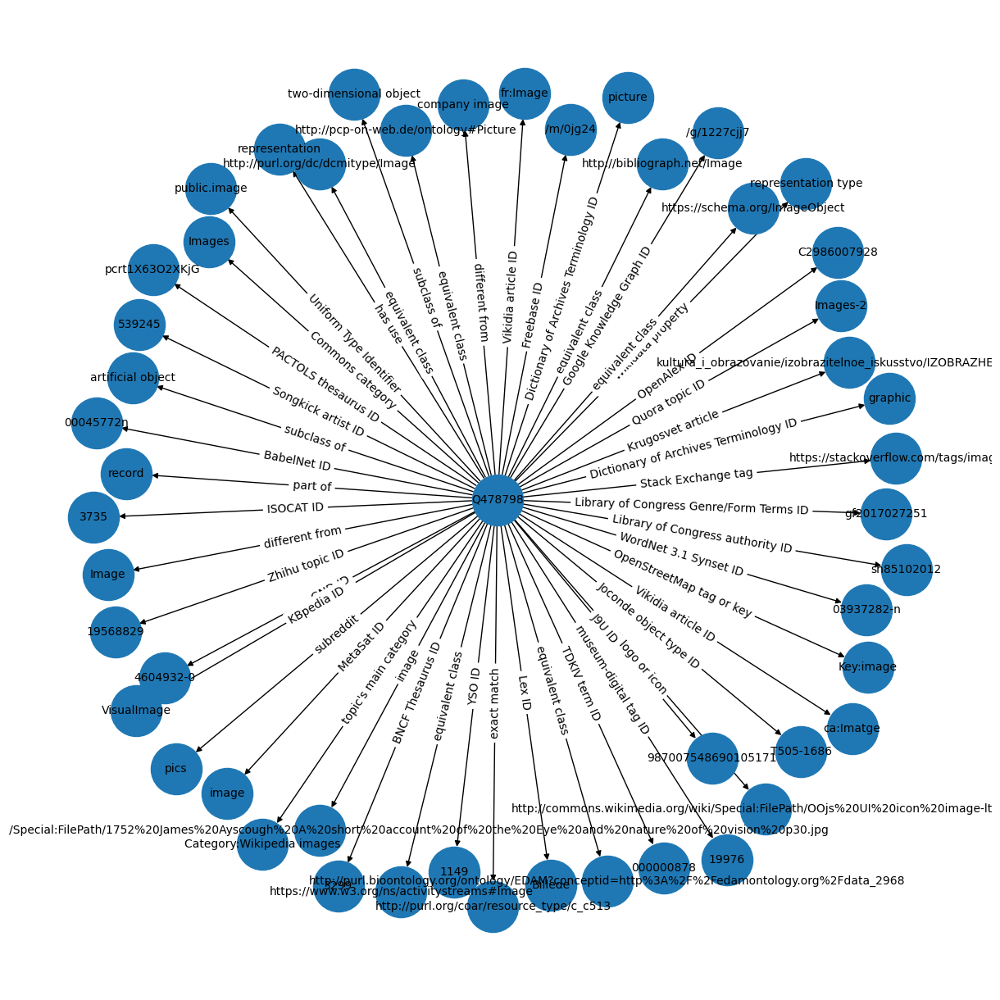

In [ ]:
import networkx as nx

def extract_subgraph(graph, start_node, max_depth=3):
    """
    Extract subgraphs related to specified nodes from the knowledge graph.

    :param graph: original knowledge graph (NetworkX graph object)
    :param start_node: starting node (such as the QID corresponding to "image")
    :param max_depth: Maximum traversal depth (default 3)
    :return: Extracted subgraph (NetworkX graph object)
    """
    subgraph = nx.DiGraph()

    visited = set()
    queue = [(start_node, 0)]  # (current node, current depth)

    while queue:
        current_node, current_depth = queue.pop(0)

        # Skip if node has been visited or exceeds maximum depth
        if current_node in visited or current_depth > max_depth:
            continue

        visited.add(current_node)
        subgraph.add_node(current_node, **graph.nodes[current_node])

        for neighbor in graph.neighbors(current_node):
            subgraph.add_edge(current_node, neighbor, **graph.edges[current_node, neighbor])
            queue.append((neighbor, current_depth + 1))

    return subgraph

# Example: Extract subimages related to "image"
image_qid = get_qid("image")
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, image_qid, max_depth=3)

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("image_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'image' not found")

In [ ]:
print("Nodes:", subgraph.nodes())
print("Edges:", subgraph.edges(data=True))

Nodes: ['Q478798', 'image', 'Category:Wikipedia images', 'company image', 'representation', 'representation type', 'artificial object', 'Image', 'record', 'two-dimensional object', 'public.image', 'ca:Imatge', 'fr:Image', '1149', '3299', '3735', '19976', '19568829', '539245', 'pics', 'picture', 'Images', 'http://bibliograph.net/Image', 'http://commons.wikimedia.org/wiki/Special:FilePath/1752%20James%20Ayscough%20A%20short%20account%20of%20the%20Eye%20and%20nature%20of%20vision%20p30.jpg', 'http://commons.wikimedia.org/wiki/Special:FilePath/OOjs%20UI%20icon%20image-ltr.svg', 'http://pcp-on-web.de/ontology#Picture', 'http://purl.bioontology.org/ontology/EDAM?conceptid=http%3A%2F%2Fedamontology.org%2Fdata_2968', 'http://purl.org/coar/resource_type/c_c513', 'http://purl.org/dc/dcmitype/Image', 'https://stackoverflow.com/tags/image', 'https://www.w3.org/ns/activitystreams#Image', '/g/1227cjj7', '/m/0jg24', '000000878', '00045772n', '03937282-n', '4604932-0', '987007548690105171', 'Billede',

与 'artificial' 相关的子图已保存为 artificial_subgraph.gml


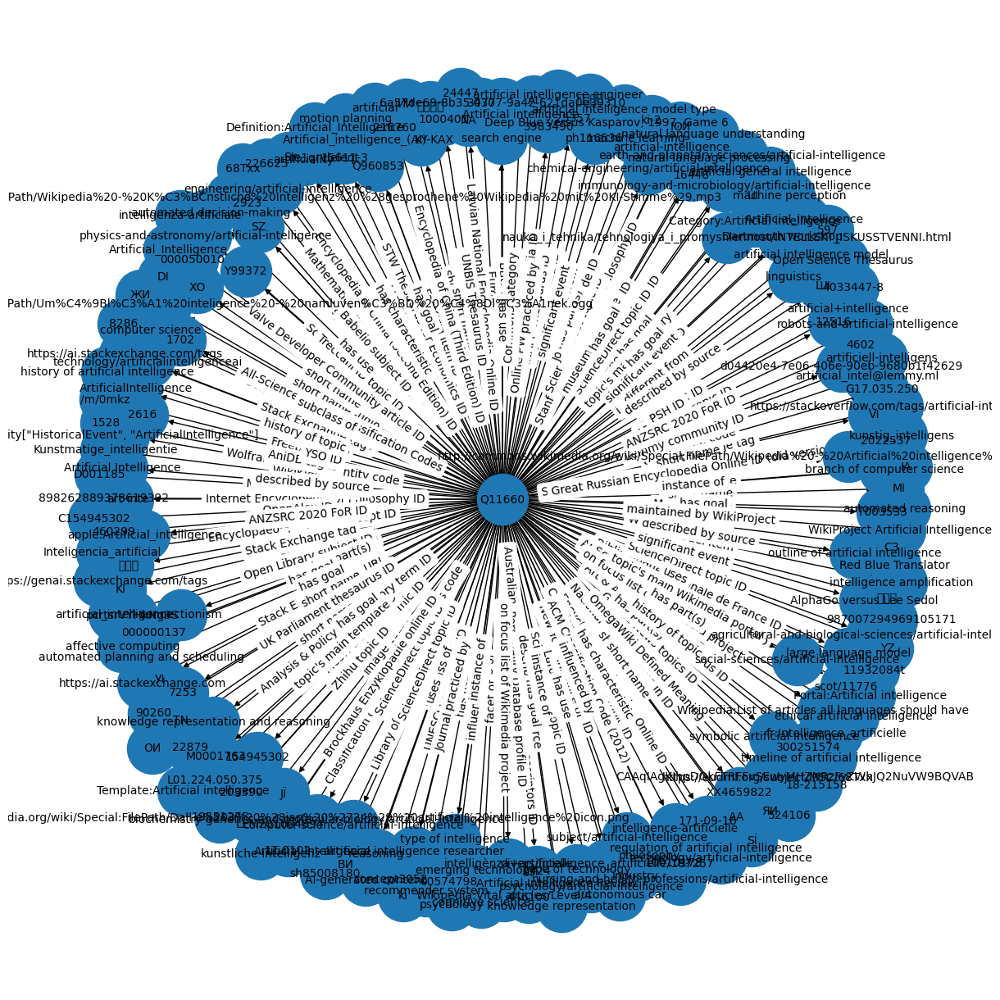

Subgraph Nodes: 198
Subgraph Edges: 197


In [ ]:
# Example: Extract subgraphs related to "artificial"
artificial_qid = get_qid("artificial intelligence")  # Get the QID of "artificial"
if artificial_qid:
    subgraph = extract_subgraph(knowledge_graph, artificial_qid, max_depth=3)

    # save
    nx.write_gml(subgraph, "artificial_subgraph.gml")
    print("The subgraph related to 'artificial' has been saved as artificial_subgraph.gml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("artificial_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'artificial' not found")

print(f"Subgraph Nodes: {subgraph.number_of_nodes()}")
print(f"Subgraph Edges: {subgraph.number_of_edges()}")

与 'machine' 相关的子图已保存为 machine_subgraph.graphml


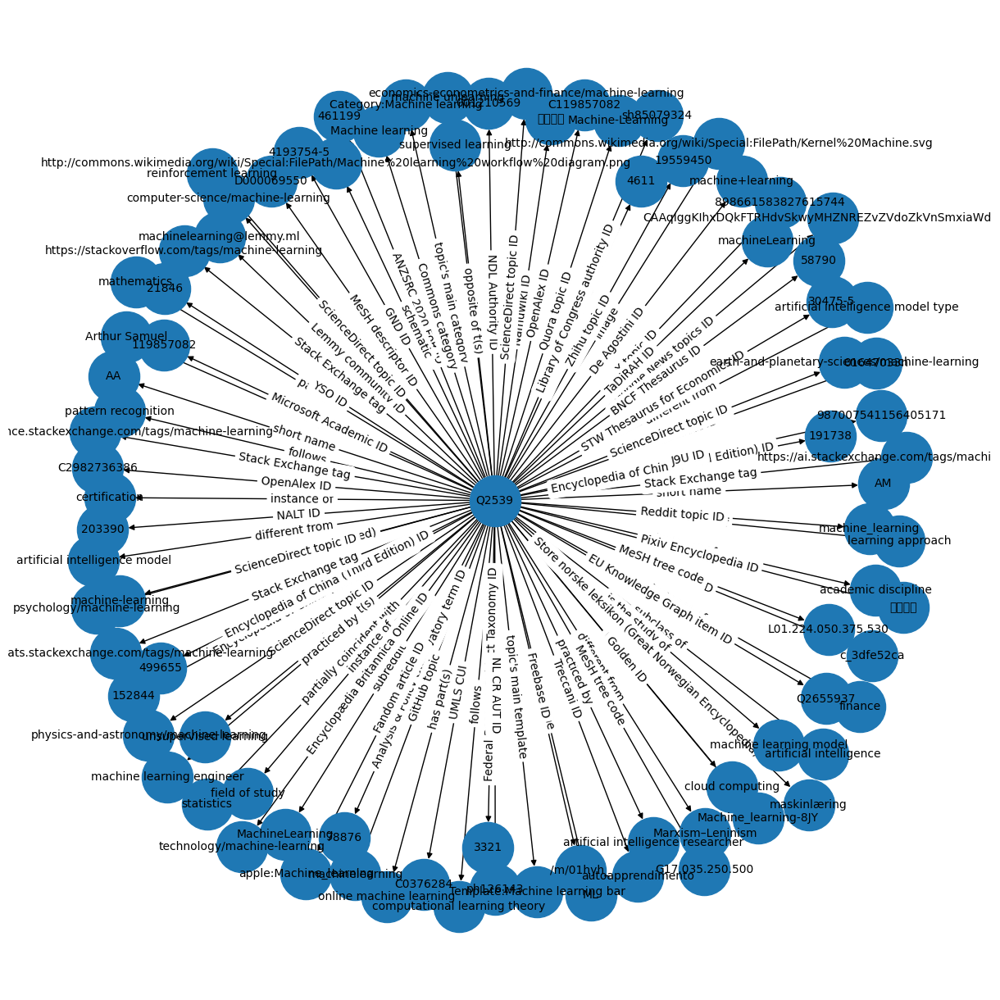

Subgraph Nodes: 86
Subgraph Edges: 85


In [ ]:
# Example: Extract subgraphs related to "machine"
machine_qid = get_qid("machine learning")
if machine_qid:
    subgraph = extract_subgraph(knowledge_graph, machine_qid, max_depth=3)

    nx.write_gml(subgraph, "machine_subgraph.gml")
    print("The subgraph related to 'machine' has been saved as machine_subgraph.graphml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("machine_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'machine' not found")

print(f"Subgraph Nodes: {subgraph.number_of_nodes()}")
print(f"Subgraph Edges: {subgraph.number_of_edges()}")

Current Node: Q478798
  Edge: Q478798 --MetaSat ID--> image
  Edge: Q478798 --topic's main category--> Category:Wikipedia images
  Edge: Q478798 --different from--> company image
  Edge: Q478798 --has use--> representation
  Edge: Q478798 --Wikidata property--> representation type
  Edge: Q478798 --subclass of--> artificial object
  Edge: Q478798 --different from--> Image
  Edge: Q478798 --part of--> record
  Edge: Q478798 --subclass of--> two-dimensional object
  Edge: Q478798 --Uniform Type Identifier--> public.image
  Edge: Q478798 --Vikidia article ID--> ca:Imatge
  Edge: Q478798 --Vikidia article ID--> fr:Image
  Edge: Q478798 --YSO ID--> 1149
  Edge: Q478798 --BNCF Thesaurus ID--> 3299
  Edge: Q478798 --ISOCAT ID--> 3735
  Edge: Q478798 --museum-digital tag ID--> 19976
  Edge: Q478798 --Zhihu topic ID--> 19568829
  Edge: Q478798 --Songkick artist ID--> 539245
  Edge: Q478798 --subreddit--> pics
  Edge: Q478798 --Dictionary of Archives Terminology ID--> picture
  Edge: Q478798 --C

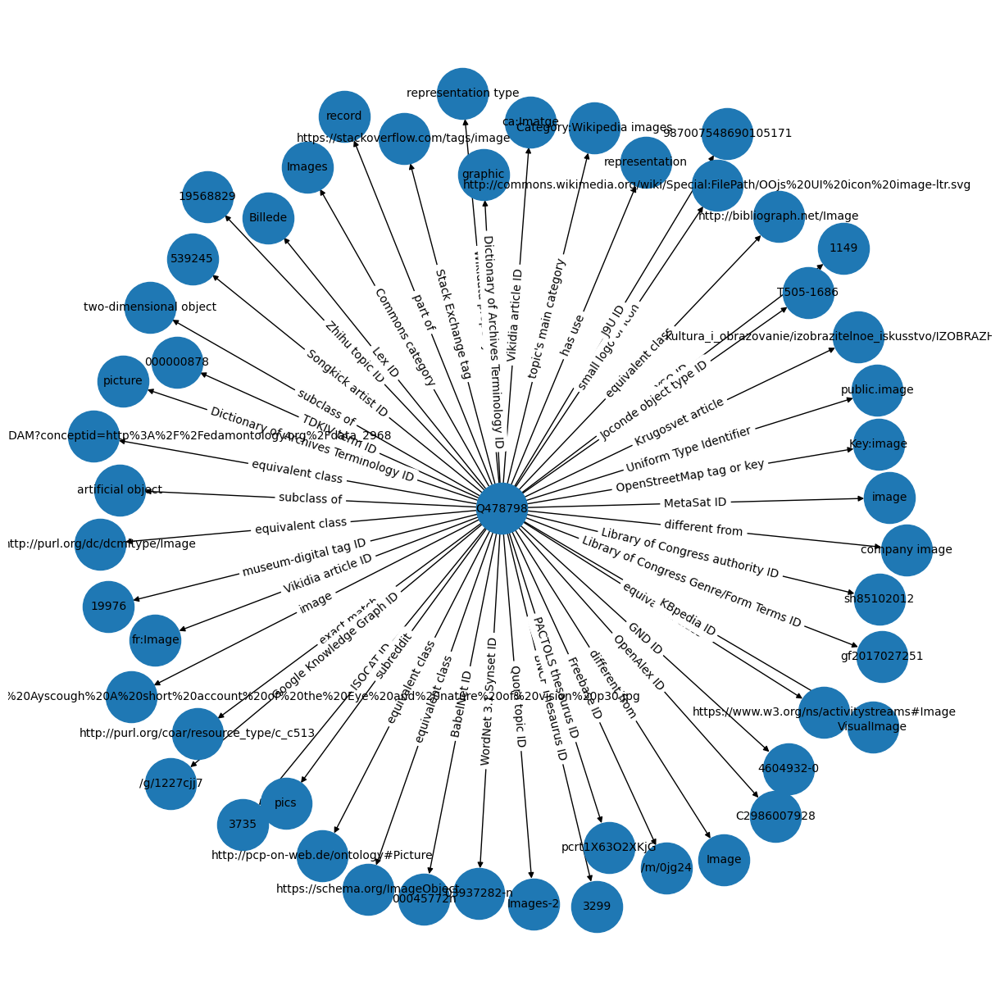

In [ ]:
import networkx as nx

def extract_subgraph(graph, start_node):
"""
    Extract the subgraph related to the specified node from the knowledge graph and traverse until there are no more associated nodes.

    :param graph: original knowledge graph (NetworkX graph object)
    :param start_node: starting node (such as the QID corresponding to "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize subgraph
    subgraph = nx.DiGraph()

    # BFS
    visited = set()
    queue = [start_node]

    while queue:
        current_node = queue.pop(0)

        if current_node in visited:
            continue

        visited.add(current_node)
        subgraph.add_node(current_node, **graph.nodes[current_node])

        print(f"Current Node: {current_node}")

        for neighbor in graph.neighbors(current_node):
            subgraph.add_edge(current_node, neighbor, **graph.edges[current_node, neighbor])
            queue.append(neighbor)

            print(f"  Edge: {current_node} --{graph.edges[current_node, neighbor]['label']}--> {neighbor}")

    return subgraph

image_qid = get_qid("image")
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, image_qid)

    nx.write_gml(subgraph, "image_subgraph.gml")
    print("The subgraph related to 'image' has been saved as image_subgraph.gml")

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("image_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'image' not found")

Current Node: Q1272626, Depth: 0
  Edge: Q1272626 --studied in--> mathematics, Depth: 1
  Edge: Q1272626 --part of--> philosophy, Depth: 1
  Edge: Q1272626 --instance of--> concept, Depth: 1
  Edge: Q1272626 --has use--> depicting object, Depth: 1
  Edge: Q1272626 --facet of--> manifestation, Depth: 1
  Edge: Q1272626 --subclass of--> sign, Depth: 1
  Edge: Q1272626 --different from--> representation, Depth: 1
  Edge: Q1272626 --topic's main category--> Category:Wikipedia images, Depth: 1
  Edge: Q1272626 --topic's main category--> Category:Images, Depth: 1
  Edge: Q1272626 --different from--> Obraz, Depth: 1
  Edge: Q1272626 --Encyclopedia of China (Third Edition) ID--> 26462, Depth: 1
  Edge: Q1272626 --Google Knowledge Graph ID--> /g/122dl31d, Depth: 1
  Edge: Q1272626 --Treccani's Dizionario di Filosofia ID--> rappresentazione, Depth: 1
Current Node: mathematics, Depth: 1
Current Node: philosophy, Depth: 1
Current Node: concept, Depth: 1
Current Node: depicting object, Depth: 1
Cur

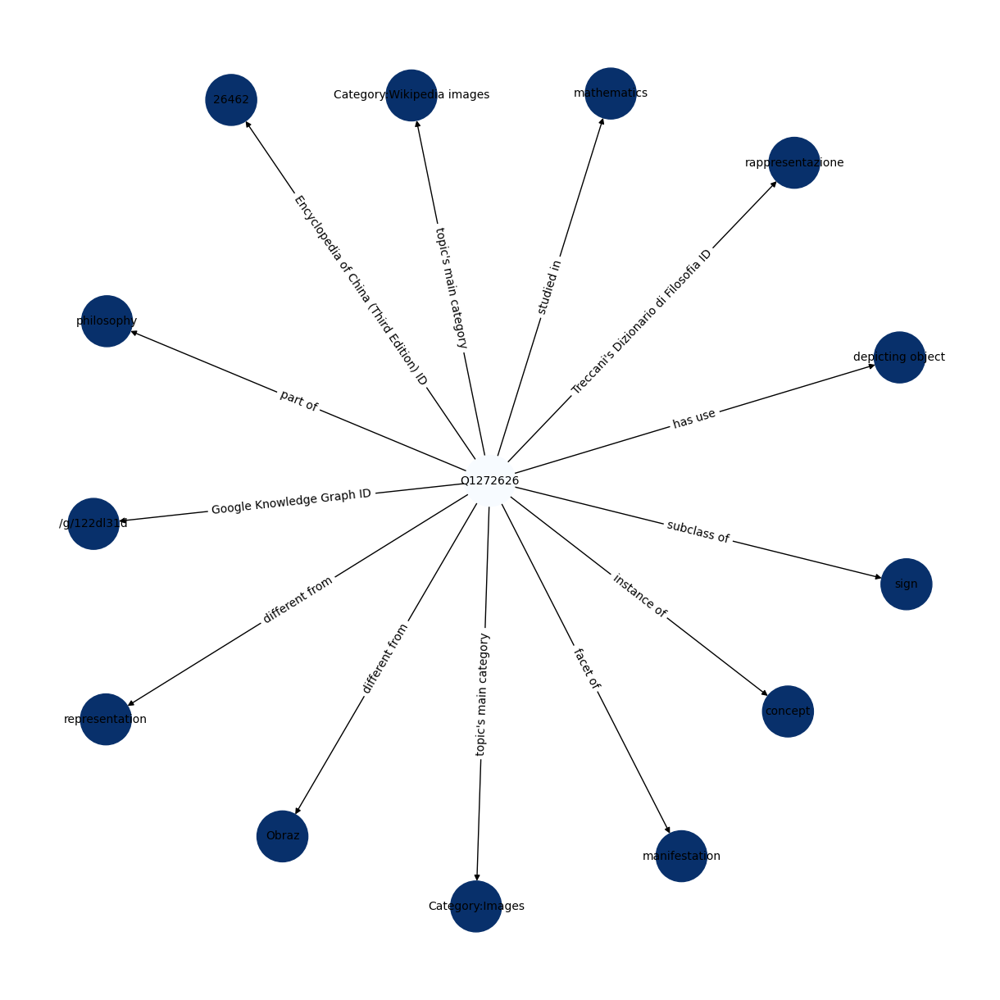

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def extract_subgraph(graph, start_node):
"""
    Extract subgraphs related to specified nodes from the knowledge graph until there are no more associated nodes, and retain hierarchical information.

    :param graph: original knowledge graph (NetworkX graph object)
    :param start_node: starting node (such as the QID corresponding to "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize subgraph
    subgraph = nx.DiGraph()

    # BFS
    visited = set()
    queue = [(start_node, 0)]

    while queue:
        current_node, depth = queue.pop(0)

        if current_node in visited:
            continue

        visited.add(current_node)


        subgraph.add_node(current_node, depth=depth, label=current_node)

        print(f"Current Node: {current_node}, Depth: {depth}")

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # If the neighbor node is not visited, add it to the queue and continue traversing
            if neighbor not in visited:
                # Calculate neighbor's level (current level + 1)
                new_depth = depth + 1
                # Add edges to subgraphs and preserve hierarchical relationships
                subgraph.add_edge(current_node, neighbor, label=graph.edges[current_node, neighbor].get("label", "no_label"), depth=depth)

                # Add neighbor nodes to the queue and increase the depth by 1
                queue.append((neighbor, new_depth))

                print(f"  Edge: {current_node} --{graph.edges[current_node, neighbor].get('label', 'no_label')}--> {neighbor}, Depth: {new_depth}")

    return subgraph

# "image"
image_qid = get_qid("image")
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, image_qid)

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    node_depths = nx.get_node_attributes(subgraph, "depth")
    node_colors = [node_depths[node] for node in subgraph.nodes()]

    nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10, node_color=node_colors, cmap=plt.cm.Blues)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("image_subgraph.png")
    plt.show()
else:
    print("QID corresponding to 'image' not found")

Current Node: Q478798, Depth: 0
  Edge: Q478798 --MetaSat ID--> image, Next Depth: 1
  Edge: Q478798 --topic's main category--> Category:Wikipedia images, Next Depth: 1
  Edge: Q478798 --different from--> company image, Next Depth: 1
  Edge: Q478798 --has use--> representation, Next Depth: 1
  Edge: Q478798 --Wikidata property--> representation type, Next Depth: 1
  Edge: Q478798 --subclass of--> artificial object, Next Depth: 1
  Edge: Q478798 --different from--> Image, Next Depth: 1
  Edge: Q478798 --part of--> record, Next Depth: 1
  Edge: Q478798 --subclass of--> two-dimensional object, Next Depth: 1
  Edge: Q478798 --Uniform Type Identifier--> public.image, Next Depth: 1
  Edge: Q478798 --Vikidia article ID--> ca:Imatge, Next Depth: 1
  Edge: Q478798 --Vikidia article ID--> fr:Image, Next Depth: 1
  Edge: Q478798 --YSO ID--> 1149, Next Depth: 1
  Edge: Q478798 --BNCF Thesaurus ID--> 3299, Next Depth: 1
  Edge: Q478798 --ISOCAT ID--> 3735, Next Depth: 1
  Edge: Q478798 --museum-dig

ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

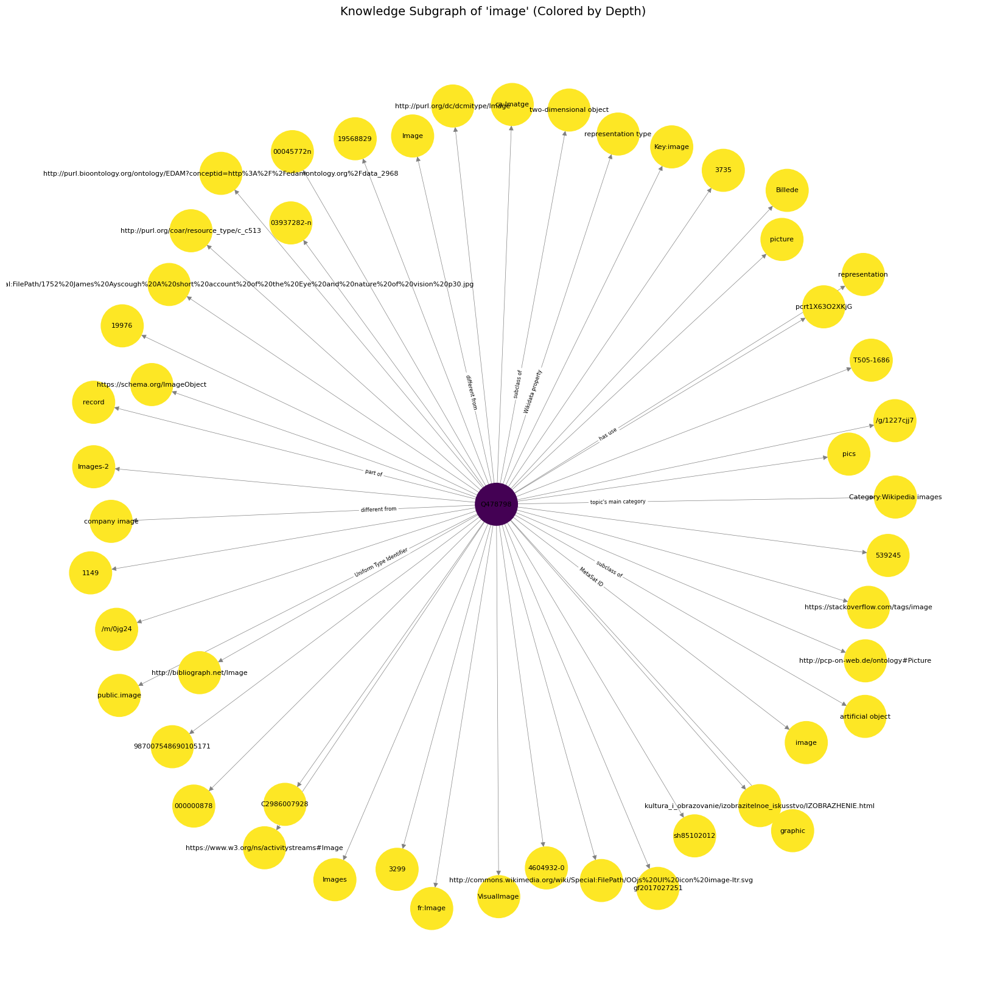

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def extract_subgraph(graph, start_node):
    """
    Extracts a subgraph related to the specified node from the knowledge graph until no more connected nodes are found.

    :param graph: Original knowledge graph (NetworkX graph object)
    :param start_node: Starting node (e.g., the QID corresponding to "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize the subgraph
    subgraph = nx.DiGraph()

    # Use BFS for traversal
    visited = set()  # Track visited nodes
    queue = [(start_node, 0)]  # Current node and its level (initial level = 0)

    while queue:
        current_node, depth = queue.pop(0)

        # Skip if the node has been visited
        if current_node in visited:
            continue

        # Mark the node as visited
        visited.add(current_node)

        # Add the current node and its attributes to the subgraph, and include level information
        subgraph.add_node(current_node, depth=depth, label=current_node)

        print(f"Current Node: {current_node}, Depth: {depth}")

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # Add edge to the subgraph (whether the neighbor has been visited or not)
            edge_label = graph.edges[current_node, neighbor].get("label", "no_label")
            subgraph.add_edge(current_node, neighbor, label=edge_label, depth=depth)

            # If the neighbor node has not been visited, add it to the queue
            if neighbor not in visited:
                queue.append((neighbor, depth + 1))
                print(f"  Edge: {current_node} --{edge_label}--> {neighbor}, Next Depth: {depth + 1}")

    return subgraph

# Example: Extract the subgraph related to "image"
image_qid = get_qid("image")  # Retrieve the QID for "image"
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, image_qid)

    # Save the subgraph to a file
    nx.write_gml(subgraph, "image_subgraph.gml")
    print("Subgraph related to 'image' has been saved as image_subgraph.gml")

    # Visualize the subgraph (colored by depth)
    plt.figure(figsize=(16, 16))
    pos = nx.spring_layout(subgraph, k=0.5)  # Adjust the layout parameter k to increase node spacing
    node_depths = nx.get_node_attributes(subgraph, "depth")
    node_colors = [node_depths[node] for node in subgraph.nodes()]

    # Draw nodes and edges
    nx.draw(
        subgraph, pos,
        with_labels=True,
        node_size=2500,
        font_size=8,
        node_color=node_colors,
        cmap=plt.cm.viridis,
        edge_color="gray",
        width=0.5,
        arrowsize=12
    )

    # Add edge labels (only show the first 10 to avoid clutter)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(
        subgraph, pos,
        edge_labels={k: v for k, v in list(edge_labels.items())[:10]},
        font_size=6,
        label_pos=0.3
    )

    plt.title("Knowledge Subgraph of 'image' (Colored by Depth)", fontsize=14)
    plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis), label="Depth")
    plt.savefig("image_subgraph.png", dpi=300, bbox_inches="tight")
    plt.show()
else:
    print("The QID corresponding to 'image' was not found.")

Current Node: image (QID: Q478798), Depth: 0
与 'image' 相关的子图已保存为 image_subgraph.gml


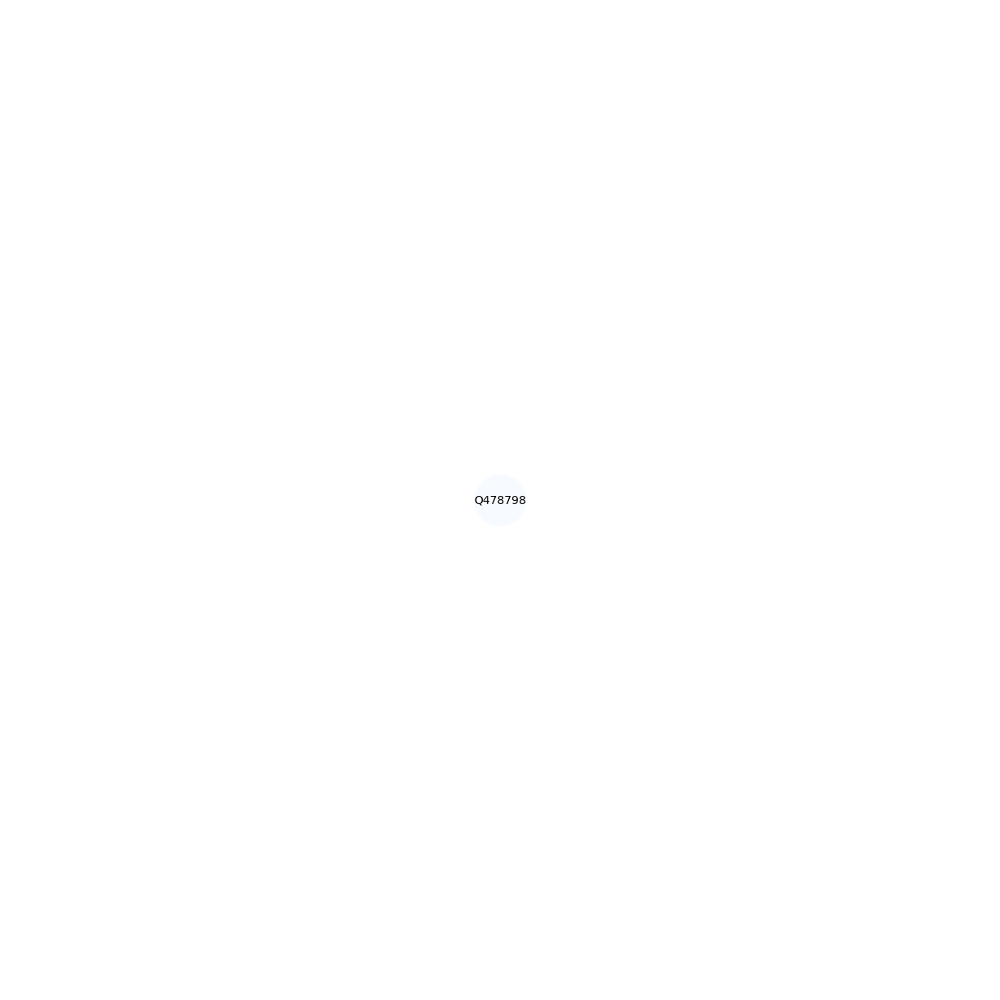

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def extract_subgraph(graph, start_node):
    """
    Extract a subgraph related to the specified node from the knowledge graph until no more connected nodes are found.

    :param graph: Original knowledge graph (NetworkX graph object)
    :param start_node: Starting node (e.g., QID or label for "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize the subgraph
    subgraph = nx.DiGraph()

    # Use BFS for traversal
    visited = set()  # Track visited nodes
    queue = [(start_node, 0)]  # Current node and its level (initial level = 0)

    while queue:
        current_node, depth = queue.pop(0)

        # Get QID for the current node
        if not current_node.startswith("Q"):  # If the current node is not a QID, retrieve its QID
            current_qid = get_qid(current_node)
            if not current_qid:
                print(f"Warning: No QID found for node '{current_node}'. Skipping.")
                continue
        else:
            current_qid = current_node  # If it is already a QID, use it directly

        # Skip if the node has already been visited
        if current_qid in visited:
            continue

        # Mark the node as visited
        visited.add(current_qid)

        # Add the current node and its attributes to the subgraph, including level information
        subgraph.add_node(current_qid, depth=depth, label=current_node)

        print(f"Current Node: {current_node} (QID: {current_qid}), Depth: {depth}")

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # Get QID for the neighbor
            if not neighbor.startswith("Q"):  # If the neighbor is not a QID, retrieve its QID
                neighbor_qid = get_qid(neighbor)
                if not neighbor_qid:
                    print(f"Warning: No QID found for neighbor '{neighbor}'. Skipping.")
                    continue
            else:
                neighbor_qid = neighbor  # If it is already a QID, use it directly

            # Add edge to the subgraph (whether the neighbor has been visited or not)
            edge_label = graph.edges[current_node, neighbor].get("label", "no_label")
            subgraph.add_edge(current_qid, neighbor_qid, label=edge_label, depth=depth)

            # If the neighbor has not been visited, add it to the queue
            if neighbor_qid not in visited:
                queue.append((neighbor, depth + 1))  # Add neighbor's label to the queue
                print(f"  Edge: {current_node} (QID: {current_qid}) --{edge_label}--> {neighbor} (QID: {neighbor_qid}), Next Depth: {depth + 1}")

    return subgraph

# Example: Extract subgraph related to "image"
image_label = "image"  # Use label as the starting node
subgraph = extract_subgraph(knowledge_graph, image_label)

# Save the subgraph to a file
nx.write_gml(subgraph, "image_subgraph.gml")
print("Subgraph related to 'image' has been saved as image_subgraph.gml")

# Visualize the subgraph (optional)
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(subgraph)
node_depths = nx.get_node_attributes(subgraph, "depth")
node_colors = [node_depths[node] for node in subgraph.nodes()]

nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10, node_color=node_colors, cmap=plt.cm.Blues)
edge_labels = nx.get_edge_attributes(subgraph, "label")
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
# plt.savefig("image_subgraph.png")
plt.show()

In [ ]:
def get_qid(label):
    """Retrieve the corresponding QID for an entity by its label (ensuring the ID starts with 'Q')"""
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        # Extract the QID
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        return qid
    return None

In [ ]:
def get_qid(label):
    """Retrieve the corresponding entity QID by label (ensuring the ID starts with 'Q')"""
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)

    try:
        results = sparql.query().convert()
        if results["results"]["bindings"]:
            # Extract the QID
            qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
            return qid
        else:
            # print(f"No QID found for label '{label}'.")
            return None
    except Exception as e:
        print(f"Query error: {e}")
        # Catch errors and return None to ensure the program continues running
        return None

In [ ]:
def extract_subgraph(graph, current_node):
    """
    Extract a subgraph related to the specified node from the knowledge graph, preserving depth information.

    :param graph: Original knowledge graph (NetworkX graph object)
    :param current_node: Node (e.g., the QID corresponding to "image")
    :return: Extracted subgraph (NetworkX graph object)
    """
    # Initialize the subgraph
    subgraph = nx.DiGraph()

    # Use BFS traversal
    visited = set()  # Track visited nodes
    time.sleep(1)
    qid = get_qid(current_node)
    if qid in graph:
        current_node = qid
    else:
        current_node = current_node
    queue = [(current_node, 0)]  # Current node and its depth information (initial depth is 0)

    while queue:
        current_node, depth = queue.pop(0)

        # Skip if the node has already been visited
        if current_node in visited:
            continue

        # Mark the node as visited
        visited.add(current_node)

        # Add the current node and its attributes to the subgraph, preserving depth information
        subgraph.add_node(current_node, depth=depth, label=current_node)

        print(f"Current Node: {current_node}, Depth: {depth}")

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # If the neighbor node has not been visited, add it to the queue and continue traversal
            if neighbor not in visited:
                # Calculate the neighbor's depth (current depth + 1)
                new_depth = depth + 1
                # Add the edge to the subgraph, preserving the depth relationship
                subgraph.add_edge(current_node, neighbor, label=graph.edges[current_node, neighbor].get("label", "no_label"), depth=depth)

                # Add the neighbor node to the queue, increasing the depth by 1
                time.sleep(1)
                qid = get_qid(neighbor)
                if qid in graph:
                    queue.append((qid, new_depth))
                else:
                    queue.append((neighbor, new_depth))

                print(f"  Edge: {current_node} --{graph.edges[current_node, neighbor].get('label', 'no_label')}--> {neighbor}, Depth: {new_depth}")

    return subgraph

# Example: Extract the subgraph related to "image"
time.sleep(1)
image_qid = get_qid("image")  # Get the QID of "image"
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, "image")

    # Save the subgraph to a file
    nx.write_gml(subgraph, "image_subgraph.gml")
    print("Subgraph related to 'image' has been saved as image_subgraph.gml")

    # Visualize the subgraph (optional)
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(subgraph)
    node_depths = nx.get_node_attributes(subgraph, "depth")
    node_colors = [node_depths[node] for node in subgraph.nodes()]

    nx.draw(subgraph, pos, with_labels=True, node_size=2, font_size=1, node_color=node_colors, cmap=plt.cm.Blues)
    edge_labels = nx.get_edge_attributes(subgraph, "label")
    nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    plt.savefig("image_subgraph.png")
    plt.show()
else:
    print("No QID found for 'image'")

Streaming output truncated to the last 5000 lines.
  Edge: Q5 --FAST ID--> 962832, Depth: 3
  Edge: Q5 --J9U ID--> 987007546070205171, Depth: 3
  Edge: Q5 --MeSH tree code--> B01.050.150.900.649.313.988.400.112.400.400, Depth: 3
  Edge: Q5 --Krugosvet article--> biologiya/chelovek-razumnyi-homo-sapiens, Depth: 3
  Edge: Q5 --UMLS CUI--> C0086418, Depth: 3
  Edge: Q5 --NCI Thesaurus ID--> C14225, Depth: 3
  Edge: Q5 --OpenAlex ID--> C2777938546, Depth: 3
  Edge: Q5 --OpenAlex ID--> C2992909513, Depth: 3
  Edge: Q5 --OpenAlex ID--> C3020439559, Depth: 3
  Edge: Q5 --Google News topics ID--> CAAqJggKIiBDQkFTRWdvSkwyMHZNR1JuZHpseUVnVmxiaTFIUWlnQVAB, Depth: 3
  Edge: Q5 --All the Tropes article ID--> Category:Humans_Are_Indexed, Depth: 3
  Edge: Q5 --UNESCO Thesaurus ID--> concept4084, Depth: 3
  Edge: Q5 --MeSH descriptor ID--> D006801, Depth: 3
  Edge: Q5 --KBpedia ID--> HomoSapiens-asAnimal, Depth: 3
  Edge: Q5 --Archive of Our Own tag--> Human being, Depth: 3
  Edge: Q5 --JSTOR topic ID

KeyboardInterrupt: 

In [ ]:
print(list(knowledge_graph.nodes())[:10])

['Q478798', 'image', 'P18', 'traffic sign', 'P14', 'logo image', 'transport network', 'European route E40', 'Countrywide Blue Tour in Hungary', 'road number']


### A Subgraph with Depth < 4

In [ ]:
def extract_subgraph(graph, current_node):
    """
    Extract a subgraph related to the specified node, up to 3 layers deep.
    It stops when no more connected nodes are found and retains hierarchical information.

    :param graph: The original knowledge graph (NetworkX graph object)
    :param current_node: The starting node (e.g., QID for "image")
    :return: The extracted subgraph (NetworkX graph object)
    """
    # Initialize the subgraph
    subgraph = nx.DiGraph()

    # Use BFS to traverse the graph
    visited = set()  # Keep track of visited nodes
    time.sleep(1)

    # Get the QID of the starting node
    qid = get_qid(current_node)
    if qid in graph:
        current_node = qid
    else:
        current_node = current_node

    # Queue to store nodes with their depth information
    queue = [(current_node, 0)]  # Start node with depth 0

    while queue:
        current_node, depth = queue.pop(0)

        # If the node has already been visited, skip it
        if current_node in visited:
            continue

        # Mark the current node as visited
        visited.add(current_node)

        # Add the current node and its depth to the subgraph
        subgraph.add_node(current_node, depth=depth, label=current_node)

        # Stop the traversal if depth exceeds the limit (3 layers deep)
        if depth >= 3:
            continue

        # Traverse all neighbors of the current node
        for neighbor in graph.neighbors(current_node):
            # If the neighbor has not been visited, add it to the queue and continue traversal
            if neighbor not in visited:
                # Calculate the new depth for the neighbor (current depth + 1)
                new_depth = depth + 1
                # Add edge to the subgraph with the label and depth information
                subgraph.add_edge(current_node, neighbor, label=graph.edges[current_node, neighbor].get("label", "no_label"), depth=depth)

                # Add the neighbor node to the queue for further traversal
                time.sleep(1)
                qid = get_qid(neighbor)
                if qid in graph:
                    queue.append((qid, new_depth))
                else:
                    queue.append((neighbor, new_depth))

    return subgraph

# Example: Extract subgraph related to "image"
time.sleep(1)
image_qid = get_qid("image")  # Get the QID for "image"
if image_qid:
    subgraph = extract_subgraph(knowledge_graph, "image")

    # Save the subgraph to a file
    nx.write_gml(subgraph, "image_subgraph.gml")
    print("The subgraph related to 'image' has been saved as image_subgraph.gml")

    # Visualize the subgraph (optional)
    # plt.figure(figsize=(12, 12))
    # pos = nx.spring_layout(subgraph)
    # node_depths = nx.get_node_attributes(subgraph, "depth")
    # node_colors = [node_depths[node] for node in subgraph.nodes()]

    # nx.draw(subgraph, pos, with_labels=True, node_size=2000, font_size=10, node_color=node_colors, cmap=plt.cm.Blues)
    # edge_labels = nx.get_edge_attributes(subgraph, "label")
    # nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels)
    # plt.savefig("image_subgraph.png")
    # plt.show()
else:
    print("QID for 'image' was not found.")

查询出错：QueryBadFormed: A bad request has been sent to the endpoint: probably the SPARQL query is badly formed. 

Response:
b'SPARQL-QUERY: queryStr=\n    SELECT ?entity WHERE {\n      ?entity rdfs:label ""People""@en.\n      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))\n    }\n    LIMIT 1\n    \njava.util.concurrent.ExecutionException: org.openrdf.query.MalformedQueryException: Lexical error at line 3, column 34.  Encountered: "\\"" (34), after : "People"\n\tat java.util.concurrent.FutureTask.report(FutureTask.java:122)\n\tat java.util.concurrent.FutureTask.get(FutureTask.java:206)\n\tat com.bigdata.rdf.sail.webapp.BigdataServlet.submitApiTask(BigdataServlet.java:292)\n\tat com.bigdata.rdf.sail.webapp.QueryServlet.doSparqlQuery(QueryServlet.java:678)\n\tat com.bigdata.rdf.sail.webapp.QueryServlet.doGet(QueryServlet.java:290)\n\tat com.bigdata.rdf.sail.webapp.RESTServlet.doGet(RESTServlet.java:240)\n\tat com.bigdata.rdf.sail.webapp.MultiTenancyServlet.doGet(MultiTe

KeyError: 'image'

<Figure size 1200x1200 with 0 Axes>

### Wikibase-Item

```
# 1677
SELECT ?property ?propertyLabel WHERE {
  ?property wikibase:propertyType wikibase:WikibaseItem .
  SERVICE wikibase:label { bd:serviceParam wikibase:language "en". }
}
ORDER BY ?propertyLabel
```



In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

def get_item_properties():
    """
    Query all Wikidata properties with data type 'item'.

    :return: A list of properties and their labels
    """
    # SPARQL query
    query = """
    SELECT ?property ?propertyLabel WHERE {
      ?property wikibase:propertyType wikibase:WikibaseItem .
      SERVICE wikibase:label { bd:serviceParam wikibase:language "en". }
    }
    ORDER BY ?propertyLabel
    """

    # Set up SPARQL query
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)

    # Execute the query and parse results
    results = sparql.query().convert()
    properties = []

    for result in results["results"]["bindings"]:
        property_uri = result["property"]["value"]
        property_label = result["propertyLabel"]["value"]
        properties.append({
            "property": property_uri.split("/")[-1],  # Extract property ID (e.g., P31)
            "label": property_label
        })

    return properties

# Example: Get all properties with data type 'item'
item_properties = get_item_properties()

# Print results
for prop in item_properties:
    print(f"Property: {prop['property']}, Label: {prop['label']}")

Property: P9897, Label: App Store age rating
Property: P3156, Label: Australian Classification
Property: P9086, Label: BAMID film rating
Property: P2629, Label: BBFC rating
Property: P6452, Label: CBFC rating
Property: P9028, Label: CCC classification
Property: P853, Label: CERO rating
Property: P6657, Label: CHVRS Classification
Property: P7603, Label: CITES Appendix
Property: P5475, Label: CJKV variant character
Property: P2758, Label: CNC film rating (France)
Property: P3402, Label: CNC film rating (Romania)
Property: P880, Label: CPU
Property: P9887, Label: Candomblé nation
Property: P2643, Label: Carnegie Classification of Institutions of Higher Education
Property: P3501, Label: Christian liturgical rite
Property: P3216, Label: ClassInd rating
Property: P9798, Label: Classification of the Functions of Government
Property: P9126, Label: Commons media contributed by
Property: P6731, Label: Commons quality assessment
Property: P660, Label: EC enzyme classification
Property: P2756, La

In [ ]:
import csv

# Save the results to a CSV file
with open("item_properties.csv", "w", newline="", encoding="utf-8") as csvfile:
    fieldnames = ["property", "label"]
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

    writer.writeheader()  # Write the header row
    for prop in item_properties:
        writer.writerow(prop)  # Write each property as a row

print("Results have been saved to item_properties.csv")

Results have been saved to item_properties.csv


In [ ]:
item_properties

[{'property': 'P9897', 'label': 'App Store age rating'},
 {'property': 'P3156', 'label': 'Australian Classification'},
 {'property': 'P9086', 'label': 'BAMID film rating'},
 {'property': 'P2629', 'label': 'BBFC rating'},
 {'property': 'P6452', 'label': 'CBFC rating'},
 {'property': 'P9028', 'label': 'CCC classification'},
 {'property': 'P853', 'label': 'CERO rating'},
 {'property': 'P6657', 'label': 'CHVRS Classification'},
 {'property': 'P7603', 'label': 'CITES Appendix'},
 {'property': 'P5475', 'label': 'CJKV variant character'},
 {'property': 'P2758', 'label': 'CNC film rating (France)'},
 {'property': 'P3402', 'label': 'CNC film rating (Romania)'},
 {'property': 'P880', 'label': 'CPU'},
 {'property': 'P9887', 'label': 'Candomblé nation'},
 {'property': 'P2643',
  'label': 'Carnegie Classification of Institutions of Higher Education'},
 {'property': 'P3501', 'label': 'Christian liturgical rite'},
 {'property': 'P3216', 'label': 'ClassInd rating'},
 {'property': 'P9798',
  'label': '

In [ ]:
# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize knowledge graph
knowledge_graph = nx.DiGraph()
visited_entities = {}  # Used to track entities already queried and their sources (labels and properties) to avoid duplicates

# Create a set of valid properties (property IDs) from item_properties
valid_properties = {prop['property'] for prop in item_properties}

def query_entity_properties(qid, label, depth=3, valid_properties=None):
    """Recursively query the properties and related entities of an entity, return triples"""
    if depth == 0 or qid in visited_entities:
        return

    # Delay to avoid hitting API limits
    time.sleep(1)

    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    # Mark the entity as visited and record its sources
    if qid not in visited_entities:
        visited_entities[qid] = set()

    visited_entities[qid].add(label)  # Record the source label for this entity

    # Iterate over all properties
    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # If the property is in the valid properties list, proceed
        property_id = result["property"]["value"].split("/")[-1]
        if valid_properties and property_id not in valid_properties:
            continue

        # Save the triple (Entity, Property, Entity)
        knowledge_graph.add_node(qid, label=qid)
        knowledge_graph.add_node(value, label=value)
        knowledge_graph.add_edge(qid, value, label=prop)
        print(qid, value, prop)

        # If the value is an entity (QID), recursively query it
        if "wikidata.org/entity/" in value_uri:
            next_qid = value_uri.split("/")[-1]
            query_entity_properties(next_qid, label, depth-1, valid_properties)

def build_knowledge_graph(labels, max_depth=3):
    """Build the knowledge graph based on the input labels"""
    for label in labels:
        time.sleep(1)
        qid = get_qid(label)
        if qid:
            query_entity_properties(qid, label, depth=max_depth, valid_properties=valid_properties)

    # Save the graph to a file
    nx.write_gml(knowledge_graph, "knowledge_graph_item_artificial.gml")
    print("Knowledge graph has been saved as 'knowledge_graph_item_artificial.gml'")

    # Visualization (optional)
    # plt.figure(figsize=(12, 12))
    # pos = nx.spring_layout(knowledge_graph)
    # nx.draw(knowledge_graph, pos, with_labels=False, node_size=2, font_size=0.1)
    # edge_labels = nx.get_edge_attributes(knowledge_graph, "label")
    # nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels)
    # plt.savefig("knowledge_graph.png")
    # plt.show()

# Example input: labels for querying
labels = ["artificial intelligence"]
build_knowledge_graph(labels, max_depth=3)

Streaming output truncated to the last 5000 lines.
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXIXа, 1900 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXII, 1901 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXI, 1900 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIа, 1901 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIIIа, 1901 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIV, 1902 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIIа, 1901 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIII, 1901 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXV, 1902 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXVа, 1902 has part(s)
Q602358 Brockhaus and Efron Encyclopedic Dictionary. Volume XXXIVа, 1902 has part(s)
Q602358 Brockhaus and 

### Next
	1.	Standardize the graph format (review the content of the triples).
	2.	Delete non-English word nodes.
	3.	Query by property as an item datatype ???
	4.	Query for cluster center words -> match all nodes with various words.

### Questions
	1.	If a broad-range word is found, the entire graph’s center of gravity will shift significantly -> see “artificial” –> ? “fruit image”.
	2.	The selection of properties is crucial -> both directions are important.

In [ ]:
# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

def find_relationship(qid1, qid2, max_depth=5):
    """
    Find the relationship path between two QIDs.

    :param qid1: QID of the first entity
    :param qid2: QID of the second entity
    :param max_depth: Maximum search depth
    :return: Relationship path (e.g., [("A", "P1", "B"), ("B", "P2", "C")])
    """
    # Use BFS to search for relationship paths
    visited = set()
    queue = [(qid1, [])]  # (current node, path)

    while queue:
        current_node, path = queue.pop(0)

        # If the target node is found, return the path
        if current_node == qid2:
            return path

        # Skip if the node is already visited or the maximum depth is exceeded
        if current_node in visited or len(path) >= max_depth:
            continue

        # Mark the node as visited
        visited.add(current_node)

        # Query all neighbors of the current node
        query = f"""
        SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
          wd:{current_node} ?p ?value.
          ?property wikibase:directClaim ?p.
          OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
          SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
        }}
        """
        sparql = SPARQLWrapper(SPARQL_ENDPOINT)
        sparql.setQuery(query)
        sparql.setReturnFormat(JSON)
        results = sparql.query().convert()

        # Iterate over all neighbors
        for result in results["results"]["bindings"]:
            prop = result["propertyLabel"]["value"]
            value = result.get("valueLabel", {}).get("value", result["value"]["value"])
            value_uri = result["value"]["value"]

            # If the value is an entity (QID), add it to the queue
            if "wikidata.org/entity/" in value_uri:
                next_qid = value_uri.split("/")[-1]
                queue.append((next_qid, path + [(current_node, prop, next_qid)]))

    return None  # No relationship path found

def get_relationship_between_words(word1, word2):
    """
    Get the relationship path between two words.

    :param word1: The first word
    :param word2: The second word
    :return: Relationship path (e.g., [("A", "P1", "B"), ("B", "P2", "C")])
    """
    # Get QIDs
    qid1 = get_qid(word1)
    qid2 = get_qid(word2)

    if not qid1 or not qid2:
        return None  # No corresponding QID found

    # Find the relationship path
    return find_relationship(qid1, qid2)

# Example: Find the relationship between two words
word1 = "image"
word2 = "artificial intelligence"
relationship_path = get_relationship_between_words(word1, word2)

if relationship_path:
    print("Relationship Path:")
    for step in relationship_path:
        print(f"{step[0]} --{step[1]}--> {step[2]}")
else:
    print("No relationship path found")

关系路径：
Q478798 --Wikidata property--> P18
P18 --Wikidata property example--> Q62
Q62 --twinned administrative body--> Q8684
Q8684 --present in work--> Q14171368
Q14171368 --main subject--> Q11660


## Choose Less Propertites


In [ ]:
import requests

def search_wikidata(term):
    url = "https://www.wikidata.org/w/api.php"
    params = {
        'action': 'wbsearchentities',
        'search': term,
        'language': 'en',
        'format': 'json',
        'limit': 10  # Limit the number of results
    }
    response = requests.get(url, params=params)
    return response.json()

# Example: Search for the term in Wikidata
result = search_wikidata("image")
for entity in result['search']:
    print(f"ID: {entity['id']}, Label: {entity['label']}, Description: {entity['description']}")

ID: Q478798, Label: image, Description: artifact that depicts or records visual perception
ID: Q1659584, Label: ImageJ, Description: image processing software
ID: Q112270642, Label: ImageQuant, Description: software for biomedical image analysis
ID: Q860755, Label: image analysis, Description: extraction of information from images via digital image processing techniques
ID: Q1272626, Label: representation, Description: entity or process that portrays something else, usually in a simplified or approximated manner
ID: Q861092, Label: image registration, Description: mapping of images into a coherent coordinate system
ID: Q1659580, Label: image, Description: reputation or impression that a plurality of people has on an object of expression
ID: Q913301, Label: Image Comics, Description: American comic book publisher
ID: Q860623, Label: image, Description: set of all values of a function; set of all values that a function can produce; subset of codomain
ID: Q725252, Label: satellite imagery

In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON
import requests

# SPARQL endpoint for Wikidata
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

def get_exact_match_wikidata(term):
    """
    Perform exact match for a term in Wikidata using SPARQL.
    """
    query = f"""
    SELECT ?entity ?entityLabel WHERE {{
      ?entity rdfs:label "{term}"@en.
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    LIMIT 10
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    matches = []
    for result in results["results"]["bindings"]:
        entity = result["entity"]["value"]
        label = result["entityLabel"]["value"]
        matches.append({"id": entity.split("/")[-1], "label": label})
    return matches

def search_wikidata(term):
    """
    Perform a fuzzy search for a term in Wikidata using the API.
    """
    url = "https://www.wikidata.org/w/api.php"
    params = {
        'action': 'wbsearchentities',
        'search': term,
        'language': 'en',
        'format': 'json',
        'limit': 10
    }
    response = requests.get(url, params=params)
    return response.json()

def match_term_to_wikidata(term):
    """
    Match a term to Wikidata using both exact and fuzzy matching.
    """
    # Try exact match using SPARQL
    exact_matches = get_exact_match_wikidata(term)
    if exact_matches:
        return exact_matches

    # If no exact match, try fuzzy matching using the API
    fuzzy_matches = search_wikidata(term)
    return [{"id": entity['id'], "label": entity['label'], "description": entity.get("description", "")} for entity in fuzzy_matches['search']]

# Example term matching from a custom dictionary
term_list = ["fruit image"] # , "artificial intelligence", "pictures"

for term in term_list:
    matches = match_term_to_wikidata(term)
    print(f"Matches for {term}:")
    for match in matches:
        print(f"ID: {match['id']}, Label: {match['label']}, Description: {match.get('description', 'No description')}")
    print("\n")

Matches for fruit image:
ID: Q127311822, Label: Fruit Image Classification Using Convolutional Neural Networks, Description: scholarly article




In [ ]:
pip install fuzzywuzzy[speedup]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.7/162.7 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 35.2 MB/s eta 0:00:00


In [ ]:
from fuzzywuzzy import fuzz
from fuzzywuzzy import process

# Simple ratio matching
def fuzzy_match_fuzzywuzzy(term1, term2, threshold=80):
    """
    Perform fuzzy matching using FuzzyWuzzy's ratio method.
    """
    ratio = fuzz.ratio(term1.lower(), term2.lower())
    return ratio >= threshold

# Find best match in a list
def find_best_match(term, choices, threshold=80):
    best_match = process.extractOne(term, choices, scorer=fuzz.ratio, score_cutoff=threshold)
    return best_match

In [ ]:
fuzzy_match_fuzzywuzzy('fruit image', 'image')

False

In [ ]:
find_best_match('fruit image', 'image')

In [ ]:
from fuzzywuzzy import process

# List of potential matches
choices = ["image", "text", "video", "audio", "picture", "machine learning"]

# Term to find the best match for
term = "fruit image"

# Find the best match from the list
best_match = find_best_match(term, choices, threshold=80)

if best_match:
    print(f"The best match for '{term}' is '{best_match[0]}' with a score of {best_match[1]}.")
else:
    print(f"No match found for '{term}'.")

No match found for 'fruit image'.


In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

# List of relevant properties (modality and data type relationships)
RELEVANT_PROPERTIES = [
    "P31",  # instance of
    "P279",  # subclass of
    "P366",  # has use
    "P527",  # has part
    "P1163",  # media type
    "P2701",  # file format
    "P462",  # encoding format
    "P1552",  # has quality
    "P4330",  # contains
    "P101",  # field of work
    "P921",  # main subject
]

def get_qid(label):
    """Get the QID of an entity based on its label."""
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        return results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
    return None

def query_entity_properties(qid):
    """Query relevant properties of an entity."""
    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      FILTER (?property IN (wd:{", wd:".join(RELEVANT_PROPERTIES)}))
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

def build_knowledge_graph(dataset_descriptions):
    """Build a knowledge graph from dataset descriptions."""
    for description in dataset_descriptions:
        modality = description.get("modality")  # e.g., "image"
        data_types = description.get("data_types")  # e.g., ["JPEG", "PNG"]

        # Get QID for modality
        modality_qid = get_qid(modality)
        if not modality_qid:
            print(f"Warning: No QID found for modality '{modality}'. Skipping.")
            continue

        # Add modality node to the graph
        knowledge_graph.add_node(modality_qid, label=modality, type="modality")

        # Query properties of the modality
        results = query_entity_properties(modality_qid)
        for result in results["results"]["bindings"]:
            prop = result["propertyLabel"]["value"]
            value = result.get("valueLabel", {}).get("value", result["value"]["value"])
            value_uri = result["value"]["value"]

            # Add value node and edge to the graph
            if "wikidata.org/entity/" in value_uri:
                value_qid = value_uri.split("/")[-1]
                knowledge_graph.add_node(value_qid, label=value, type="entity")
                knowledge_graph.add_edge(modality_qid, value_qid, label=prop)

        # Add data types to the graph
        for data_type in data_types:
            data_type_qid = get_qid(data_type)
            if data_type_qid:
                knowledge_graph.add_node(data_type_qid, label=data_type, type="data_type")
                knowledge_graph.add_edge(modality_qid, data_type_qid, label="contains")

    # Save the knowledge graph to a file
    nx.write_gml(knowledge_graph, "dataset_knowledge_graph.gml")
    print("Knowledge graph saved to dataset_knowledge_graph.gml")

# Example dataset descriptions
dataset_descriptions = [
    {"modality": "image", "data_types": ["JPEG", "PNG"]},
    {"modality": "text", "data_types": ["CSV", "JSON"]},
    {"modality": "video", "data_types": ["MP4", "AVI"]},
]

# Build the knowledge graph
build_knowledge_graph(dataset_descriptions)

Knowledge graph saved to dataset_knowledge_graph.gml


In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

# List of relevant properties (modality and data type relationships)
RELEVANT_PROPERTIES = [
    "P31",  # instance of
    "P279",  # subclass of
    "P366",  # has use
    "P527",  # has part
    "P1163",  # media type
    "P2701",  # file format
    "P462",  # encoding format
    "P1552",  # has quality
    "P4330",  # contains
    "P101",  # field of work
    "P921",  # main subject
]

def get_qid(label):
    """Get the QID of an entity based on its label."""
    print(f"Fetching QID for label: {label}")  # Added print statement
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        print(f"Found QID for {label}: {qid}")  # Added print statement
        return qid
    else:
        print(f"No QID found for label: {label}")  # Added print statement
    return None

def query_entity_properties(qid):
    """Query relevant properties of an entity."""
    print(f"Querying properties for QID: {qid}")  # Added print statement
    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      FILTER (?property IN (wd:{", wd:".join(RELEVANT_PROPERTIES)}))
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

def build_knowledge_graph(dataset_descriptions):
    """Build a knowledge graph from dataset descriptions."""
    for description in dataset_descriptions:
        modality = description.get("modality")  # e.g., "image"
        data_types = description.get("data_types")  # e.g., ["JPEG", "PNG"]

        print(f"Processing modality: {modality}")  # Added print statement
        modality_qid = get_qid(modality)
        if not modality_qid:
            print(f"Warning: No QID found for modality '{modality}'. Skipping.")  # Added print statement
            continue

        # Add modality node to the graph
        knowledge_graph.add_node(modality_qid, label=modality, type="modality")
        print(f"Added modality node: {modality} (QID: {modality_qid})")  # Added print statement

        # Query properties of the modality
        results = query_entity_properties(modality_qid)
        for result in results["results"]["bindings"]:
            prop = result["propertyLabel"]["value"]
            value = result.get("valueLabel", {}).get("value", result["value"]["value"])
            value_uri = result["value"]["value"]

            # Add value node and edge to the graph
            if "wikidata.org/entity/" in value_uri:
                value_qid = value_uri.split("/")[-1]
                knowledge_graph.add_node(value_qid, label=value, type="entity")
                knowledge_graph.add_edge(modality_qid, value_qid, label=prop)
                print(f"Added edge: {modality_qid} --[{prop}]--> {value_qid}")  # Added print statement

        # Add data types to the graph
        for data_type in data_types:
            print(f"Processing data type: {data_type}")  # Added print statement
            data_type_qid = get_qid(data_type)
            if data_type_qid:
                knowledge_graph.add_node(data_type_qid, label=data_type, type="data_type")
                knowledge_graph.add_edge(modality_qid, data_type_qid, label="contains")
                print(f"Added edge: {modality_qid} --[contains]--> {data_type_qid}")  # Added print statement

    # Save the knowledge graph to a file
    nx.write_gml(knowledge_graph, "dataset_knowledge_graph.gml")
    print("Knowledge graph saved to dataset_knowledge_graph.gml")  # Added print statement

# Example dataset descriptions
dataset_descriptions = [
    {"modality": "image", "data_types": ["JPEG", "PNG"]},
    {"modality": "text", "data_types": ["CSV", "JSON"]},
    {"modality": "video", "data_types": ["MP4", "AVI"]},
]

# Build the knowledge graph
build_knowledge_graph(dataset_descriptions)

Processing modality: image
Fetching QID for label: image
Found QID for image: Q478798
Added modality node: image (QID: Q478798)
Querying properties for QID: Q478798
Added edge: Q478798 --[subclass of]--> Q118870638
Added edge: Q478798 --[has use]--> Q1272626
Added edge: Q478798 --[subclass of]--> Q16686448
Processing data type: JPEG
Fetching QID for label: JPEG
Found QID for JPEG: Q2195
Added edge: Q478798 --[contains]--> Q2195
Processing data type: PNG
Fetching QID for label: PNG
Found QID for PNG: Q254317
Added edge: Q478798 --[contains]--> Q254317
Processing modality: text
Fetching QID for label: text
Found QID for text: Q234460
Added modality node: text (QID: Q234460)
Querying properties for QID: Q234460
Added edge: Q234460 --[has characteristic]--> Q8192
Added edge: Q234460 --[has characteristic]--> Q34770
Added edge: Q234460 --[has part(s)]--> Q3241972
Added edge: Q234460 --[instance of]--> Q20088085
Added edge: Q234460 --[subclass of]--> Q47461344
Added edge: Q234460 --[has part

In [ ]:
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx
import time

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

# List of relevant properties (modality and data type relationships)
RELEVANT_PROPERTIES = [
    "P31",  # instance of
    "P279",  # subclass of
    "P366",  # has use
    "P527",  # has part
    "P1163",  # media type
    "P2701",  # file format
    "P462",  # encoding format
    "P1552",  # has quality
    "P4330",  # contains
    "P101",  # field of work
    "P921",  # main subject
]

def get_qid(label):
    time.sleep(1)
    """Get the QID of an entity based on its label."""
    print(f"Fetching QID for label: {label}")
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        print(f"Found QID for {label}: {qid}")
        return qid
    else:
        print(f"No QID found for label: {label}")
    return None

def query_entity_properties(qid):
    """Query relevant properties of an entity."""
    print(f"Querying properties for QID: {qid}")
    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      FILTER (?property IN (wd:{", wd:".join(RELEVANT_PROPERTIES)}))
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

def recursive_query_and_build(qid, depth=0, max_depth=5):
    """Recursively query properties and build the knowledge graph until a certain depth."""
    if depth > max_depth:
        return

    # Query properties of the given entity (modality or data_type)
    results = query_entity_properties(qid)

    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # Add value node and edge to the graph
        if "wikidata.org/entity/" in value_uri:
            value_qid = value_uri.split("/")[-1]

            # Add nodes and edge to the graph
            if value_qid not in knowledge_graph.nodes:
                knowledge_graph.add_node(value_qid, label=value, type="entity")
                print(f"Added node: {value_qid} (Label: {value})")

            if not knowledge_graph.has_edge(qid, value_qid):
                knowledge_graph.add_edge(qid, value_qid, label=prop)
                print(f"Added edge: {qid} --[{prop}]--> {value_qid}")

            # Recursively query the properties of the new entity (value_qid)
            recursive_query_and_build(value_qid, depth + 1, max_depth)

def build_knowledge_graph(dataset_descriptions, max_depth=5):
    """Build a knowledge graph from dataset descriptions."""
    for description in dataset_descriptions:
        modality = description.get("modality")  # e.g., "image"
        data_types = description.get("data_types")  # e.g., ["JPEG", "PNG"]

        print(f"Processing modality: {modality}")
        modality_qid = get_qid(modality)
        if not modality_qid:
            print(f"Warning: No QID found for modality '{modality}'. Skipping.")
            continue

        # Add modality node to the graph
        if modality_qid not in knowledge_graph.nodes:
            knowledge_graph.add_node(modality_qid, label=modality, type="modality")
            print(f"Added modality node: {modality} (QID: {modality_qid})")

        # Recursively query properties of the modality
        recursive_query_and_build(modality_qid, depth=0, max_depth=max_depth)

        # Process data types
        for data_type in data_types:
            print(f"Processing data type: {data_type}")
            data_type_qid = get_qid(data_type)
            if data_type_qid:
                if data_type_qid not in knowledge_graph.nodes:
                    knowledge_graph.add_node(data_type_qid, label=data_type, type="data_type")
                    print(f"Added data type node: {data_type} (QID: {data_type_qid})")

                if not knowledge_graph.has_edge(modality_qid, data_type_qid):
                    knowledge_graph.add_edge(modality_qid, data_type_qid, label="contains")
                    print(f"Added edge: {modality_qid} --[contains]--> {data_type_qid}")

                # Recursively query properties of the data type
                recursive_query_and_build(data_type_qid, depth=0, max_depth=max_depth)

    # Save the knowledge graph to a file
    nx.write_gml(knowledge_graph, "dataset_knowledge_graph.gml")
    print("Knowledge graph saved to dataset_knowledge_graph.gml")

# Example dataset descriptions
dataset_descriptions = [
    {"modality": "image", "data_types": ["JPEG", "PNG"]},
    {"modality": "text", "data_types": ["CSV", "JSON"]},
    {"modality": "video", "data_types": ["MP4", "AVI"]},
]

# Build the knowledge graph with a recursion depth of 2
build_knowledge_graph(dataset_descriptions, max_depth=5)

Streaming output truncated to the last 5000 lines.
Added node: Q6776685 (Label: impermanence)
Added edge: Q83378208 --[has characteristic]--> Q6776685
Added edge: Q83378208 --[has characteristic]--> Q22976818
Querying properties for QID: Q83378374
Querying properties for QID: Q83378429
Added edge: Q83378429 --[subclass of]--> Q494823
Querying properties for QID: Q494823
Added node: Q106900411 (Label: content model)
Added edge: Q83378429 --[subclass of]--> Q106900411
Querying properties for QID: Q106900411
Added edge: Q106900411 --[subclass of]--> Q4393498
Querying properties for QID: Q83378585
Added node: Q186885 (Label: timestamp)
Added edge: Q83378585 --[has characteristic]--> Q186885
Querying properties for QID: Q186885
Added edge: Q186885 --[subclass of]--> Q180160
Added node: Q11341687 (Label: mark)
Added edge: Q186885 --[subclass of]--> Q11341687
Added node: Q3331189 (Label: version, edition or translation)
Added edge: Q83378585 --[subclass of]--> Q3331189
Querying properties for

### Change it to the log file

In [ ]:
import logging
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx
import time

# Configure logging to output to a file
logging.basicConfig(
    filename='knowledge_graph.log',  # Log file name
    level=logging.INFO,  # Log level
    format='%(asctime)s - %(levelname)s - %(message)s',  # Log format
)

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

# List of relevant properties (modality and data type relationships)
RELEVANT_PROPERTIES = [
    "P31",  # instance of
    "P279",  # subclass of
    "P366",  # has use
    "P527",  # has part
    "P1163",  # media type
    "P2701",  # file format
    "P462",  # encoding format
    "P1552",  # has quality
    "P4330",  # contains
    "P101",  # field of work
    "P921",  # main subject
]

def get_qid(label):
    """Get the QID of an entity based on its label."""
    time.sleep(1)
    logging.info(f"Fetching QID for label: {label}")
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        logging.info(f"Found QID for {label}: {qid}")
        return qid
    else:
        logging.warning(f"No QID found for label: {label}")
    return None

def query_entity_properties(qid):
    """Query relevant properties of an entity."""
    logging.info(f"Querying properties for QID: {qid}")
    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      FILTER (?property IN (wd:{", wd:".join(RELEVANT_PROPERTIES)}))
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

def recursive_query_and_build(qid, depth=0, max_depth=5):
    """Recursively query properties and build the knowledge graph until a certain depth."""
    if depth > max_depth:
        return

    # Query properties of the given entity (modality or data_type)
    results = query_entity_properties(qid)

    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # Add value node and edge to the graph
        if "wikidata.org/entity/" in value_uri:
            value_qid = value_uri.split("/")[-1]

            # Add nodes and edge to the graph
            if value_qid not in knowledge_graph.nodes:
                knowledge_graph.add_node(value_qid, label=value, type="entity")
                logging.info(f"Added node: {value_qid} (Label: {value})")

            if not knowledge_graph.has_edge(qid, value_qid):
                knowledge_graph.add_edge(qid, value_qid, label=prop)
                logging.info(f"Added edge: {qid} --[{prop}]--> {value_qid}")

            # Recursively query the properties of the new entity (value_qid)
            recursive_query_and_build(value_qid, depth + 1, max_depth)

def build_knowledge_graph(dataset_descriptions, max_depth=5):
    """Build a knowledge graph from dataset descriptions."""
    for description in dataset_descriptions:
        modality = description.get("modality")  # e.g., "image"
        data_types = description.get("data_types")  # e.g., ["JPEG", "PNG"]

        logging.info(f"Processing modality: {modality}")
        modality_qid = get_qid(modality)
        if not modality_qid:
            logging.warning(f"Warning: No QID found for modality '{modality}'. Skipping.")
            continue

        # Add modality node to the graph
        if modality_qid not in knowledge_graph.nodes:
            knowledge_graph.add_node(modality_qid, label=modality, type="modality")
            logging.info(f"Added modality node: {modality} (QID: {modality_qid})")

        # Recursively query properties of the modality
        recursive_query_and_build(modality_qid, depth=0, max_depth=max_depth)

        # Process data types
        for data_type in data_types:
            logging.info(f"Processing data type: {data_type}")
            data_type_qid = get_qid(data_type)
            if data_type_qid:
                if data_type_qid not in knowledge_graph.nodes:
                    knowledge_graph.add_node(data_type_qid, label=data_type, type="data_type")
                    logging.info(f"Added data type node: {data_type} (QID: {data_type_qid})")

                if not knowledge_graph.has_edge(modality_qid, data_type_qid):
                    knowledge_graph.add_edge(modality_qid, data_type_qid, label="contains")
                    logging.info(f"Added edge: {modality_qid} --[contains]--> {data_type_qid}")

                # Recursively query properties of the data type
                recursive_query_and_build(data_type_qid, depth=0, max_depth=max_depth)

    # Save the knowledge graph to a file
    nx.write_gml(knowledge_graph, "dataset_knowledge_graph.gml")
    logging.info("Knowledge graph saved to dataset_knowledge_graph.gml")

# Example dataset descriptions
dataset_descriptions = [
    {"modality": "image", "data_types": ["JPEG", "PNG"]},
    {"modality": "text", "data_types": ["CSV", "JSON"]},
    {"modality": "video", "data_types": ["MP4", "AVI"]},
]

# Build the knowledge graph with a recursion depth of 5
build_knowledge_graph(dataset_descriptions, max_depth=5)

## Our Dataset

In [ ]:
import json

def extract_modalities_and_data_types(input_file, output_file):
    """
    Extract modalities and data types from the input JSON file and save them in the desired format.

    :param input_file: Path to the input JSON file (e.g., "results.json")
    :param output_file: Path to the output JSON file (e.g., "modalities_data_types.json")
    """
    # Load the input JSON file
    with open(input_file, "r", encoding="utf-8") as f:
        data = json.load(f)

    # Initialize a list to store the extracted data
    extracted_data = []

    # Iterate through each task in the input data
    for task in data:
        # Check if the output is a string and needs parsing
        output = task["output"]
        if isinstance(output, str):
            try:
                # Try to load the string as JSON
                output = json.loads(output)
            except json.JSONDecodeError as e:
                print(f"Error decoding JSON in task {task['custom_id']}: {e}")
                continue

        # Now, we expect 'output' to be a dictionary with a 'modalities' field
        if "modalities" in output:
            modalities = output["modalities"]
            for modality in modalities:
                modality_title = modality["title"]
                data_types = [dt["title"] for dt in modality["data_types"]]
                extracted_data.append({"modality": modality_title, "data_types": data_types})

    # Save the extracted data to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(extracted_data, f, indent=4)

    print(f"Extracted data saved to {output_file}")

# Example usage
input_file = "results.json"  # Path to the input JSON file
output_file = "modalities_data_types.json"  # Path to the output JSON file
extract_modalities_and_data_types(input_file, output_file)

Error decoding JSON in task task-4818: Expecting value: line 1 column 1 (char 0)
Error decoding JSON in task task-6036: Expecting value: line 1 column 1 (char 0)
Error decoding JSON in task task-6037: Expecting value: line 1 column 1 (char 0)
Error decoding JSON in task task-6785: Expecting value: line 1 column 1 (char 0)
Error decoding JSON in task task-8880: Expecting value: line 1 column 1 (char 0)
Error decoding JSON in task task-9045: Expecting value: line 1 column 1 (char 0)
Extracted data saved to modalities_data_types.json


In [ ]:
def merge_data_types(input_file, output_file):
    """
    Merge data types for the same modality and save the result in a new file.

    :param input_file: Path to the input JSON file (e.g., "modalities_data_types.json")
    :param output_file: Path to the output JSON file (e.g., "merged_modalities_data_types.json")
    """
    # Load the input JSON file
    with open(input_file, "r", encoding="utf-8") as f:
        data = json.load(f)

    # Dictionary to store merged modalities and their data types
    modality_dict = {}

    # Iterate through the data and group by modality
    for entry in data:
        modality = entry["modality"]
        data_types = entry["data_types"]

        # If modality is already in the dictionary, merge data types
        if modality in modality_dict:
            modality_dict[modality].update(data_types)  # Add new data types (set ensures no duplicates)
        else:
            modality_dict[modality] = set(data_types)  # Start a new set of data types

    # Convert the dictionary back to a list of dictionaries for the output
    merged_data = [{"modality": modality, "data_types": list(data_types)}
                   for modality, data_types in modality_dict.items()]

    # Save the merged data to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(merged_data, f, indent=4)

    print(f"Merged data saved to {output_file}")

# Example usage
input_file = "modalities_data_types.json"  # Path to the input JSON file
output_file = "merged_modalities_data_types.json"  # Path to the output JSON file
merge_data_types(input_file, output_file)

Merged data saved to merged_modalities_data_types.json


In [ ]:
# Data validation
def check_labels_in_wikidata(json_file):
    """Reads the json file and checks if each label has a QID."""
    with open(json_file, "r", encoding="utf-8") as file:
        data = json.load(file)

    # Access the 'isolated_type' key in the data
    isolated_types = data.get("isolated_type", [])

    # Loop through the data and get QID for each 'wikidata_label'
    for item in isolated_types:
        label = item.get("wikidata_label")

        if label:
            qid = get_qid(label)
            if not qid:
                logging.warning(f"Label '{label}' does not have a corresponding QID.")
        else:
            logging.warning("No 'wikidata_label' found in item.")

json_file = "wikidata_isolated_matched.json"
check_labels_in_wikidata(json_file)

In [ ]:
def extract_datatypes(input_file, output_file):
    """
    Extract all data types from the input JSON file and save them to a list.

    :param input_file: Path to the input JSON file (e.g., "data.json")
    :param output_file: Path to the output file (e.g., "datatypes.json")
    """
    # Load the input JSON file
    with open(input_file, "r", encoding="utf-8") as f:
        data = json.load(f)

    # Extract all datatypes from the "isolated_type" list
    datatypes = [entry["datatype"] for entry in data["isolated_type"]]

    # Save the extracted datatypes to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(datatypes, f, indent=4)

    print(f"Extracted datatypes saved to {output_file}")

# Example usage
input_file = "wikidata_isolated_matched.json"  # Path to the input JSON file
output_file = "datatypes_wikidata_matched.json"  # Path to the output JSON file
extract_datatypes(input_file, output_file)

Extracted datatypes saved to datatypes_wikidata_matched.json


In [ ]:
def filter_and_save_modalities(input_modalities_file, input_datatypes_file, output_file):
    """
    Filter the data types in the input modalities file based on the available data types
    in the input datatypes file, and save the filtered result to a new output file.

    :param input_modalities_file: Path to the merged modalities file (e.g., "merged_modalities_data_types.json")
    :param input_datatypes_file: Path to the datatypes file (e.g., "datatypes.json")
    :param output_file: Path to the output file (e.g., "filtered_modalities.json")
    """
    # Load the merged modalities data (contains modalities and data types)
    with open(input_modalities_file, "r", encoding="utf-8") as f:
        merged_modalities = json.load(f)

    # Load the datatypes list
    with open(input_datatypes_file, "r", encoding="utf-8") as f:
        valid_datatypes = set(json.load(f))  # Using a set for faster lookup

    # Filter the data types in merged modalities based on valid datatypes
    filtered_modalities = []
    for modality in merged_modalities:
        modality_title = modality["modality"]
        valid_data_types = [dt for dt in modality["data_types"] if dt in valid_datatypes]

        if valid_data_types:  # Only add the modality if there are valid data types
            filtered_modalities.append({
                "modality": modality_title,
                "data_types": valid_data_types
            })

    # Save the filtered modalities to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(filtered_modalities, f, indent=4)

    print(f"Filtered modalities saved to {output_file}")

# Example usage
input_modalities_file = "merged_modalities_data_types.json"  # Path to the merged modalities JSON file
input_datatypes_file = "datatypes_wikidata_matched.json"  # Path to the datatypes JSON file
output_file = "filtered_modalities_datatypes.json"  # Path to the output filtered file

filter_and_save_modalities(input_modalities_file, input_datatypes_file, output_file)

Filtered modalities saved to filtered_modalities_datatypes.json


In [ ]:
def replace_data_types_with_labels(filtered_modalities_file, wikidata_file, output_file):
    """
    Replace data types in the filtered modalities file with corresponding wikidata labels
    from the wikidata file and save the updated data to a new output file.

    :param filtered_modalities_file: Path to the filtered modalities file (e.g., "filtered_modalities_datatypes.json")
    :param wikidata_file: Path to the wikidata matched file (e.g., "wikidata_isolated_matched.json")
    :param output_file: Path to the output file (e.g., "updated_filtered_modalities.json")
    """
    # Load the filtered modalities data
    with open(filtered_modalities_file, "r", encoding="utf-8") as f:
        filtered_modalities = json.load(f)

    # Load the wikidata isolated matched data
    with open(wikidata_file, "r", encoding="utf-8") as f:
        wikidata_data = json.load(f)

    # Create a mapping from datatype to wikidata_label
    datatype_to_label = {entry["datatype"]: entry["wikidata_label"] for entry in wikidata_data["isolated_type"]}

    # Iterate through the filtered modalities and replace data types with wikidata labels
    updated_modalities = []
    for modality in filtered_modalities:
        modality_title = modality["modality"]
        updated_data_types = []

        for data_type in modality["data_types"]:
            # Replace the data type with the corresponding wikidata_label if it exists
            if data_type in datatype_to_label:
                updated_data_types.append(datatype_to_label[data_type])
            else:
                updated_data_types.append(data_type)  # Keep the original if no match found

        updated_modalities.append({
            "modality": modality_title,
            "data_types": updated_data_types
        })

    # Save the updated modalities to the output file
    with open(output_file, "w", encoding="utf-8") as f:
        json.dump(updated_modalities, f, indent=4)

    print(f"Updated filtered modalities saved to {output_file}")

# Example usage
filtered_modalities_file = "filtered_modalities_datatypes.json"  # Path to the filtered modalities JSON file
wikidata_file = "wikidata_isolated_matched.json"  # Path to the wikidata matched JSON file
output_file = "updated_filtered_modalities.json"  # Path to the output updated file

replace_data_types_with_labels(filtered_modalities_file, wikidata_file, output_file)

Updated filtered modalities saved to updated_filtered_modalities.json


## KG per Modality

In [ ]:
import json
import os
import logging
from SPARQLWrapper import SPARQLWrapper, JSON
import networkx as nx
import time

# Configure logging to output to a file
logging.basicConfig(
    filename='knowledge_graph.log',  # Log file name
    level=logging.INFO,  # Log level
    format='%(asctime)s - %(levelname)s - %(message)s',  # Log format
)

# Wikidata SPARQL endpoint
SPARQL_ENDPOINT = "https://query.wikidata.org/sparql"

# Initialize the knowledge graph
knowledge_graph = nx.DiGraph()

# List of relevant properties (modality and data type relationships)
RELEVANT_PROPERTIES = [
    "P31",  # instance of
    "P279",  # subclass of
    "P366",  # has use
    "P527",  # has part
    "P1163",  # media type
    "P2701",  # file format
    "P462",  # encoding format
    "P1552",  # has quality
    "P4330",  # contains
    "P101",  # field of work
    "P921",  # main subject
]

def get_qid(label):
    """Get the QID of an entity based on its label."""
    time.sleep(1)
    logging.info(f"Fetching QID for label: {label}")
    query = f"""
    SELECT ?entity WHERE {{
      ?entity rdfs:label "{label}"@en.
      FILTER (STRSTARTS(STR(?entity), "http://www.wikidata.org/entity/Q"))
    }}
    LIMIT 1
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query().convert()

    if results["results"]["bindings"]:
        qid = results["results"]["bindings"][0]["entity"]["value"].split("/")[-1]
        logging.info(f"Found QID for {label}: {qid}")
        return qid
    else:
        logging.warning(f"No QID found for label: {label}")
    return None

def query_entity_properties(qid):
    """Query relevant properties of an entity."""
    logging.info(f"Querying properties for QID: {qid}")
    query = f"""
    SELECT ?property ?propertyLabel ?value ?valueLabel WHERE {{
      wd:{qid} ?p ?value.
      ?property wikibase:directClaim ?p.
      FILTER (?property IN (wd:{", wd:".join(RELEVANT_PROPERTIES)}))
      OPTIONAL {{ ?value rdfs:label ?valueLabel. FILTER(LANG(?valueLabel) = "en") }}
      SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en". }}
    }}
    """
    sparql = SPARQLWrapper(SPARQL_ENDPOINT)
    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    return sparql.query().convert()

def recursive_query_and_build(qid, depth=0, max_depth=5):
    """Recursively query properties and build the knowledge graph until a certain depth."""
    if depth > max_depth:
        return

    # Query properties of the given entity (modality or data_type)
    results = query_entity_properties(qid)

    for result in results["results"]["bindings"]:
        prop = result["propertyLabel"]["value"]
        value = result.get("valueLabel", {}).get("value", result["value"]["value"])
        value_uri = result["value"]["value"]

        # Add value node and edge to the graph
        if "wikidata.org/entity/" in value_uri:
            value_qid = value_uri.split("/")[-1]

            # Add nodes and edge to the graph
            if value_qid not in knowledge_graph.nodes:
                knowledge_graph.add_node(value_qid, label=value, type="entity")
                logging.info(f"Added node: {value_qid} (Label: {value})")

            if not knowledge_graph.has_edge(qid, value_qid):
                knowledge_graph.add_edge(qid, value_qid, label=prop)
                logging.info(f"Added edge: {qid} --[{prop}]--> {value_qid}")

            # Recursively query the properties of the new entity (value_qid)
            recursive_query_and_build(value_qid, depth + 1, max_depth)

def save_knowledge_graph(modality, knowledge_graph, output_dir):
    """Save the knowledge graph for a given modality to a file."""
    # Create a directory for saving graphs if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    graph_filename = os.path.join(output_dir, f"{modality}_knowledge_graph.gml")

    nx.write_gml(knowledge_graph, graph_filename)
    logging.info(f"Knowledge graph for modality '{modality}' saved to {graph_filename}")

def save_log(modality, log_data, log_dir):
    """Save the logs for a given modality to a file."""
    # Create a directory for saving logs if it doesn't exist
    os.makedirs(log_dir, exist_ok=True)

    log_filename = os.path.join(log_dir, f"{modality}_log.txt")

    with open(log_filename, "w", encoding="utf-8") as f:
        f.write(log_data)

    logging.info(f"Log for modality '{modality}' saved to {log_filename}")

def process_modalities(input_file, output_graph_dir, output_log_dir, max_depth=5):
    """
    Process each modality from the input file, build knowledge graphs, and save them along with logs.

    :param input_file: Path to the JSON file containing modalities and their data types.
    :param output_graph_dir: Directory where the knowledge graphs will be saved.
    :param output_log_dir: Directory where the logs will be saved.
    :param max_depth: Maximum depth for building the knowledge graph.
    """
    # Load the modalities data from the JSON file
    with open(input_file, "r", encoding="utf-8") as f:
        modalities_data = json.load(f)

    # Process each modality individually
    for modality_data in modalities_data:
        modality = modality_data["modality"]
        data_types = modality_data["data_types"]

        logging.info(f"Processing modality: {modality}")
        modality_qid = get_qid(modality)
        if not modality_qid:
            logging.warning(f"Warning: No QID found for modality '{modality}'. Skipping.")
            continue

        # Add modality node to the graph
        if modality_qid not in knowledge_graph.nodes:
            knowledge_graph.add_node(modality_qid, label=modality, type="modality")
            logging.info(f"Added modality node: {modality} (QID: {modality_qid})")

        # Recursively query properties of the modality
        recursive_query_and_build(modality_qid, depth=0, max_depth=max_depth)

        # Process data types
        for data_type in data_types:
            logging.info(f"Processing data type: {data_type}")
            data_type_qid = get_qid(data_type)
            if data_type_qid:
                if data_type_qid not in knowledge_graph.nodes:
                    knowledge_graph.add_node(data_type_qid, label=data_type, type="data_type")
                    logging.info(f"Added data type node: {data_type} (QID: {data_type_qid})")

                if not knowledge_graph.has_edge(modality_qid, data_type_qid):
                    knowledge_graph.add_edge(modality_qid, data_type_qid, label="contains")
                    logging.info(f"Added edge: {modality_qid} --[contains]--> {data_type_qid}")

                # Recursively query properties of the data type
                recursive_query_and_build(data_type_qid, depth=0, max_depth=max_depth)

        # Save the knowledge graph and logs for the current modality
        save_knowledge_graph(modality, knowledge_graph, output_graph_dir)

        log_data = f"Building knowledge graph for modality: {modality}\n"
        log_data += f"Data types: {', '.join(data_types)}\n"
        log_data += f"Graph depth: {max_depth}\n"
        log_data += "Knowledge graph building completed successfully.\n"

        save_log(modality, log_data, output_log_dir)

# Example usage
input_file = "updated_filtered_modalities.json"  # Path to the updated filtered modalities JSON file
output_graph_dir = "knowledge_graphs"  # Directory where knowledge graphs will be saved
output_log_dir = "logs"  # Directory where logs will be saved
max_depth = 5  # Maximum recursion depth for building the knowledge graph

process_modalities(input_file, output_graph_dir, output_log_dir, max_depth)

WARNING:root:No QID found for label: 3d model
WARNING:root:Warning: No QID found for modality '3d model'. Skipping.
3D model (Q3859833)

WARNING:root:No QID found for label: numerical
WARNING:root:Warning: No QID found for modality 'numerical'. Skipping.
numeral (Q63116)

WARNING:root:No QID found for label: 3d structure
WARNING:root:Warning: No QID found for modality '3d structure'. Skipping.

WARNING:root:No QID found for label: physiological signal
WARNING:root:Warning: No QID found for modality 'physiological signal'. Skipping.

WARNING:root:No QID found for label: eeg
WARNING:root:Warning: No QID found for modality 'eeg'. Skipping.

WARNING:root:No QID found for label: physiological
WARNING:root:Warning: No QID found for modality 'physiological'. Skipping.

WARNING:root:No QID found for label: network traffic
WARNING:root:Warning: No QID found for modality 'network traffic'. Skipping.

WARNING:root:No QID found for label: structural
WARNING:root:Warning: No QID found for modality 'structural'. Skipping.

WARNING:root:No QID found for label: chemical
WARNING:root:Warning: No QID found for modality 'chemical'. Skipping.

WARNING:root:No QID found for label: neural
WARNING:root:Warning: No QID found for modality 'neural'. Skipping.

WARNING:root:No QID found for label: system log
WARNING:root:Warning: No QID found for modality 'system log'. Skipping.

WARNING:root:No QID found for label: eog
WARNING:root:Warning: No QID found for modality 'eog'. Skipping.

WARNING:root:No QID found for label: spiking neural data
WARNING:root:Warning: No QID found for modality 'spiking neural data'. Skipping.

## KG All Together

Change Depth to 3

In [ ]:
# # keep the session alive
# import time
# while True:
#     time.sleep(60)
#     print("Keeping the session alive...")